# problen statement
identitfy the customers which are eligible for loan.

In [1]:
import os

RAW_DIR = "data/raw"
PROCESSED_DIR = "data/processed"

os.makedirs(RAW_DIR, exist_ok=True)
os.makedirs(PROCESSED_DIR, exist_ok=True)

print("directories created.")

directories created.


In [2]:
import zipfile
import os

ZIP_PATH = "PRCP-1006-HomeLoanDef (1).zip"              
EXTRACT_PATH = "dataset"    

os.makedirs(EXTRACT_PATH, exist_ok=True)
with zipfile.ZipFile(ZIP_PATH, "r") as zip_ref:
    zip_ref.extractall(EXTRACT_PATH)

print("ZIP file extracted successfully")

ZIP file extracted successfully


In [3]:
csv_files = []

for root, dirs, files in os.walk(EXTRACT_PATH):
    for file in files:
        if file.lower().endswith(".csv"):
            csv_files.append(os.path.join(root, file))

print(f"Found {len(csv_files)} CSV files:")
for f in csv_files:
    print(f)

Found 7 CSV files:
dataset\Data\application_train.csv
dataset\Data\bureau.csv
dataset\Data\bureau_balance.csv
dataset\Data\credit_card_balance.csv
dataset\Data\installments_payments.csv
dataset\Data\POS_CASH_balance.csv
dataset\Data\previous_application.csv


In [4]:
import shutil

for csv_path in csv_files:
    file_name = os.path.basename(csv_path)
    secure_path = os.path.join(RAW_DIR, file_name)

    shutil.copy(csv_path, secure_path)

print("CSV files stored in data/raw/")

CSV files stored in data/raw/


In [5]:
import shutil
import os

for file in os.listdir(RAW_DIR):
    raw_file_path = os.path.join(RAW_DIR, file)
    processed_file_path = os.path.join(PROCESSED_DIR, file)

    shutil.copy(raw_file_path, processed_file_path)

print("Working copies created ")

Working copies created 


In [6]:
PROCESSED_DIR = "data/processed"

CSV_files = [
    os.path.join(PROCESSED_DIR, f)
    for f in os.listdir(PROCESSED_DIR)
    if f.endswith(".csv")
]

In [7]:
import pandas as pd
import os
import json

column_map = {}

for csv_file in CSV_files:
    try:
        df = pd.read_csv(csv_file, nrows=0)
        columns = df.columns.tolist()

        column_map[os.path.basename(csv_file)] = columns

        print(f"\nFile: {os.path.basename(csv_file)}")
        for col in columns:
            print(f"  - {col}")

    except Exception as e:
        print(f"\nFailed to read {csv_file}")
        print("Error:", e)

# Save schema
with open("column_schema.json", "w") as f:
    json.dump(column_map, f, indent=4)

print("\nColumn schema saved to column_schema.json")


File: application_train.csv
  - SK_ID_CURR
  - TARGET
  - NAME_CONTRACT_TYPE
  - CODE_GENDER
  - FLAG_OWN_CAR
  - FLAG_OWN_REALTY
  - CNT_CHILDREN
  - AMT_INCOME_TOTAL
  - AMT_CREDIT
  - AMT_ANNUITY
  - AMT_GOODS_PRICE
  - NAME_TYPE_SUITE
  - NAME_INCOME_TYPE
  - NAME_EDUCATION_TYPE
  - NAME_FAMILY_STATUS
  - NAME_HOUSING_TYPE
  - REGION_POPULATION_RELATIVE
  - DAYS_BIRTH
  - DAYS_EMPLOYED
  - DAYS_REGISTRATION
  - DAYS_ID_PUBLISH
  - OWN_CAR_AGE
  - FLAG_MOBIL
  - FLAG_EMP_PHONE
  - FLAG_WORK_PHONE
  - FLAG_CONT_MOBILE
  - FLAG_PHONE
  - FLAG_EMAIL
  - OCCUPATION_TYPE
  - CNT_FAM_MEMBERS
  - REGION_RATING_CLIENT
  - REGION_RATING_CLIENT_W_CITY
  - WEEKDAY_APPR_PROCESS_START
  - HOUR_APPR_PROCESS_START
  - REG_REGION_NOT_LIVE_REGION
  - REG_REGION_NOT_WORK_REGION
  - LIVE_REGION_NOT_WORK_REGION
  - REG_CITY_NOT_LIVE_CITY
  - REG_CITY_NOT_WORK_CITY
  - LIVE_CITY_NOT_WORK_CITY
  - ORGANIZATION_TYPE
  - EXT_SOURCE_1
  - EXT_SOURCE_2
  - EXT_SOURCE_3
  - APARTMENTS_AVG
  - BASEMENTAREA_AV

In [8]:
unique_schemas = set()

for cols in column_map.values():
    unique_schemas.add(tuple(cols))

print("\nNumber of unique column schemas:", len(unique_schemas))


Number of unique column schemas: 7


In [9]:
import pandas as pd

# Load main dataset (adjust path if needed)
app_file = "data/processed/application_train.csv"
df = pd.read_csv(app_file)

# 1. Number of rows and columns
print("\nDataset Shape")
print("Rows:", df.shape[0])
print("Columns:", df.shape[1])

# 2. Duplicate rows
duplicate_rows = df.duplicated().sum()
print("\nDuplicate Rows")
print("Number of duplicate rows:", duplicate_rows)

# 3. Check uniqueness of primary key
unique_customers = df["SK_ID_CURR"].nunique()
print("\nSK_ID_CURR")
print("Unique SK_ID_CURR:", unique_customers)
print("SK_ID_CURR unique?", unique_customers == df.shape[0])

# 4. Target column unique values and distribution
print("\nTARGET Column")

print("Unique TARGET values:")
print(df["TARGET"].unique())

print("\nTARGET value counts:")
print(df["TARGET"].value_counts())

print("\nTARGET value proportions:")
print(df["TARGET"].value_counts(normalize=True))


Dataset Shape
Rows: 307511
Columns: 122

Duplicate Rows
Number of duplicate rows: 0

SK_ID_CURR
Unique SK_ID_CURR: 307511
SK_ID_CURR unique? True

TARGET Column
Unique TARGET values:
[1 0]

TARGET value counts:
TARGET
0    282686
1     24825
Name: count, dtype: int64

TARGET value proportions:
TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64


In [10]:
import pandas as pd

pd.set_option("display.max_columns", None)   # show all columns
pd.set_option("display.width", None)         # auto width
pd.set_option("display.max_colwidth", None)  # show full column content

In [11]:
import pandas as pd

for csv_file in CSV_files:
    print("\n" + "-"*80)
    print(f"File: {csv_file}")
    print("-"*80)

    try:
        df = pd.read_csv(csv_file, nrows=100)
        print("Shape (rows, cols):", df.shape)
        display(df)

    except Exception as e:
        print("Error reading file:", e)


--------------------------------------------------------------------------------
File: data/processed\application_train.csv
--------------------------------------------------------------------------------
Shape (rows, cols): (100, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0000,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0000,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na


--------------------------------------------------------------------------------
File: data/processed\bureau.csv
--------------------------------------------------------------------------------
Shape (rows, cols): (100, 17)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,119939,5714578,Closed,currency 1,-1572,0,-1179.0,-987.0,NaN,0,225000.0,NaN,NaN,0.0,Consumer credit,-984,NaN
96,119939,5714579,Closed,currency 1,-1791,0,-1703.0,-987.0,NaN,0,22770.0,NaN,NaN,0.0,Consumer credit,-984,NaN
97,119939,5714580,Active,currency 1,-2401,0,NaN,NaN,0.0,0,99000.0,45036.0,53962.695,0.0,Credit card,-22,NaN
98,119939,5714581,Closed,currency 1,-1624,0,203.0,-1085.0,40.5,0,765000.0,NaN,NaN,0.0,Consumer credit,-1085,NaN



--------------------------------------------------------------------------------
File: data/processed\bureau_balance.csv
--------------------------------------------------------------------------------
Shape (rows, cols): (100, 3)


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
95,5715452,-30,X
96,5715452,-31,X
97,5715452,-32,X
98,5715453,0,C



--------------------------------------------------------------------------------
File: data/processed\credit_card_balance.csv
--------------------------------------------------------------------------------
Shape (rows, cols): (100, 23)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.000,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.000,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.000,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.000,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.000,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1843380,375482,-5,0.000,0,0.0,0.0,0.0,0.0,0.000,578.205,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,30.0,Active,0,0
96,2638478,354226,-2,0.000,45000,0.0,0.0,0.0,0.0,0.000,3.015,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,65.0,Active,0,0
97,1960212,285273,-1,0.000,0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,0.000,0.0,0,0.0,0.0,20.0,Completed,0,0
98,2571669,283851,-5,116710.605,900000,0.0,0.0,0.0,0.0,5928.435,6750.000,6750.0,107218.440,115084.035,115084.035,0.0,0,0.0,0.0,7.0,Active,0,0



--------------------------------------------------------------------------------
File: data/processed\installments_payments.csv
--------------------------------------------------------------------------------
Shape (rows, cols): (100, 8)


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
95,2269581,141541,0.0,94,-695.0,-695.0,406.800,406.800
96,2645533,116025,1.0,7,-873.0,-894.0,8883.945,8883.945
97,2229715,168387,1.0,11,-1299.0,-1298.0,3020.490,3020.490
98,2664388,166612,1.0,5,-2196.0,-2207.0,11524.815,11524.815



--------------------------------------------------------------------------------
File: data/processed\POS_CASH_balance.csv
--------------------------------------------------------------------------------
Shape (rows, cols): (100, 8)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
95,1230492,205698,-36,24.0,7.0,Active,0,0
96,1165758,133695,-37,24.0,8.0,Active,0,0
97,2023770,381265,-33,24.0,8.0,Active,0,0
98,2131141,288786,-34,24.0,9.0,Active,0,0



--------------------------------------------------------------------------------
File: data/processed\previous_application.csv
--------------------------------------------------------------------------------
Shape (rows, cols): (100, 37)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1851241,415052,Consumer loans,9675.855,46476.0,48775.5,0.0,46476.0,TUESDAY,16,Y,1,0.0,NaN,NaN,XAP,Approved,-1368,Cash through the bank,XAP,Children,New,Consumer Electronics,POS,XNA,Country-wide,3500,Consumer electronics,6.0,high,POS household with interest,365243.0,-1337.0,-1187.0,-1187.0,-1181.0,0.0
96,2030030,133853,Consumer loans,7253.055,104809.5,121410.0,0.0,104809.5,SATURDAY,14,Y,1,0.0,NaN,NaN,XAP,Approved,-346,Cash through the bank,XAP,NaN,Repeater,Audio/Video,POS,XNA,Country-wide,3500,Consumer electronics,18.0,low_action,POS household without interest,365243.0,-315.0,195.0,365243.0,365243.0,0.0
97,1935914,191576,Consumer loans,NaN,23400.0,23400.0,NaN,23400.0,SATURDAY,9,Y,1,NaN,NaN,NaN,XAP,Unused offer,-1412,Cash through the bank,CLIENT,Family,Repeater,Audio/Video,XNA,XNA,Country-wide,3500,Consumer electronics,NaN,XNA,POS household with interest,NaN,NaN,NaN,NaN,NaN,NaN
98,1457539,307992,Consumer loans,NaN,113215.5,113215.5,0.0,113215.5,SUNDAY,12,Y,1,0.0,NaN,NaN,XAP,Unused offer,-520,Cash through the bank,CLIENT,NaN,New,Computers,XNA,XNA,Country-wide,25,Connectivity,NaN,XNA,POS mobile with interest,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
import pandas as pd

# Load main dataset
app_file = "data/processed/application_train.csv"
df = pd.read_csv(app_file)

# Calculate missing values
missing_df = pd.DataFrame({
    "missing count": df.isnull().sum(),
    "missing percentage": (df.isnull().sum() / len(df)) * 100
})

# Sort by missing percentage
missing_df = missing_df.sort_values("missing percentage", ascending=False)

# Display top columns with missing values
print("Top columns with missing values:")
display(missing_df.head(30))

Top columns with missing values:


,missing count,missing percentage
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953


In [13]:
import pandas as pd

CHUNK_SIZE = 100_000

pd.set_option("display.max_columns", None)

for csv_file in csv_files:
    print("\n" + "-" * 100)
    print(f"Overall Statistics (FULL DATASET): {csv_file}")
    print("-" * 100)

    describe_chunks = []

    try:
        # Read file chunk by chunk
        for chunk in pd.read_csv(csv_file, chunksize=CHUNK_SIZE):
            # describe numeric columns only 
            desc = chunk.describe()
            describe_chunks.append(desc)

        # Combine chunk-level statistics
        final_stats = (
            pd.concat(describe_chunks)
              .groupby(level=0)
              .mean()
        )

        display(final_stats)

    except Exception as e:
        print("Error processing file:", e)


----------------------------------------------------------------------------------------------------
Overall Statistics (FULL DATASET): dataset\Data\application_train.csv
----------------------------------------------------------------------------------------------------


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
25%,296096.437500,0.000000,0.000000,1.125000e+05,2.700000e+05,16520.062500,2.385000e+05,0.010006,-19697.875000,-2755.750000,-7473.625000,-4299.25000,5.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333218,0.390462,0.369811,0.057700,0.044450,0.976700,0.687200,0.007800,0.000000,0.069000,0.166700,0.083300,0.018800,0.050400,0.045450,0.000000,0.000000,0.052500,0.040950,0.976575,0.697775,0.007212,0.000000,0.069000,0.166700,0.083300,0.016750,0.053975,0.042825,0.000000,0.000000,0.058300,0.044000,0.976700,0.691400,0.007825,0.000000,0.069000,0.166700,0.083300,0.018825,0.051300,0.045900,0.000000,0.000000,0.041337,0.000000,0.000000,0.000000,0.000000,-1569.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,318239.125000,0.000000,0.000000,1.468125e+05,5.145064e+05,24946.875000,4.500000e+05,0.018850,-15758.000000,-1218.750000,-4504.125000,-3254.75000,9.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.504867,0.564989,0.534377,0.087300,0.076225,0.981850,0.755200,0.020938,0.000000,0.137900,0.166700,0.208300,0.047950,0.075275,0.074325,0.000000,0.003475,0.084000,0.074525,0.981600,0.763175,0.018925,0.000000,0.137900,0.166700,0.208300,0.045875,0.076450,0.073050,0.000000,0.001125,0.086400,0.075775,0.981788,0.758500,0.020663,0.000000,0.137900,0.166700,0.208300,0.048513,0.076225,0.074725,0.000000,0.003000,0.068750,0.000000,0.000000,0.000000,0.000000,-754.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,340652.687500,0.000000,1.000000,2.025000e+05,8.086500e+05,34480.125000,6.795000


----------------------------------------------------------------------------------------------------
Overall Statistics (FULL DATASET): dataset\Data\bureau.csv
----------------------------------------------------------------------------------------------------


,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
25%,188724.694444,5.521100e+06,-1674.680556,0.000000,-1145.666667,-1494.666667,0.000000e+00,0.000000,5.111484e+04,0.000000e+00,0.000000e+00,0.000000e+00,-912.569444,0.000000e+00
50%,277933.000000,5.851602e+06,-991.972222,0.000000,-338.250000,-898.166667,0.000000e+00,0.000000,1.247625e+05,0.000000e+00,0.000000e+00,0.000000e+00,-401.666667,1.511450e+02
75%,367530.486111,6.393295e+06,-476.722222,0.000000,464.625000,-428.069444,0.000000e+00,0.000000,3.074856e+05,3.788915e+04,0.000000e+00,0.000000e+00,-34.166667,1.340876e+04
count,95357.111111,9.535711e+04,95357.111111,95357.111111,89493.055556,60154.166667,3.288556e+04,95357.111111,9.535639e+04,8.104217e+04,6.248044e+04,9.535711e+04,95357.111111,2.720206e+04
max,456240.333333,6.771950e+06,-0.444444,2701.777778,31197.500000,-0.166667,1.859913e+07,5.555556,1.408294e+08,4.825818e+07,2.855527e+06,1.268110e+06,29.777778,3.546469e+07
mean,278206.715460,5.909859e+06,-1146.137931,0.808018,504.907510,-1020.363485,3.802529e+03,0.006305,3.526923e+05,1.357738e+05,6.180360e+03,3.623231e+01,-597.848709,1.563353e+04
min,100011.388889,5.121215e+06,-2922.000000,0.000000,-39746.333333,-5087.388889,0.000000e+00,0.000000,0.000000e+00,-1.164865e+06,-1.855255e+05,0.000000e+00,-41931.277778,0.000000e+00
std,102978.963841,5.107435e+05,795.900668,36.146009,4999.462826,714.414221,1.175505e+05,0.095290,1.099954e+06,6.737355e+05,4.459221e+04,4.703095e+03,721.333642,2.581656e+05



----------------------------------------------------------------------------------------------------
Overall Statistics (FULL DATASET): dataset\Data\bureau_balance.csv
----------------------------------------------------------------------------------------------------


,SK_ID_BUREAU,MONTHS_BALANCE
25%,5.718575e+06,-45.930403
50%,6.089268e+06,-25.282051
75%,6.376263e+06,-11.006410
count,9.999973e+04,99999.725275
max,6.724052e+06,0.000000
mean,6.036297e+06,-30.741691
min,5.204930e+06,-96.000000
std,4.421722e+05,23.815960



----------------------------------------------------------------------------------------------------
Overall Statistics (FULL DATASET): dataset\Data\credit_card_balance.csv
----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
25%,1.433389e+06,189496.070513,-55.487179,0.000000e+00,4.673077e+04,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,1.528419e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,4.179487,0.000000,0.000000
50%,1.897360e+06,278399.948718,-27.641026,0.000000e+00,1.223077e+05,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,13.497115,2.747465e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,15.282051,0.000000,0.000000
75%,2.369082e+06,367585.794872,-11.358974,8.795075e+04,1.811538e+05,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,6175.978846,9.023077e+03,7.089403e+03,8.406029e+04,8.777896e+04,8.780451e+04,0.000000,0.000000,0.000000,0.000000,32.461538,0.000000,0.000000
count,9.846954e+04,98469.538462,98469.538462,9.846954e+04,9.846954e+04,7.924349e+04,9.846954e+04,79243.487179,7.924349e+04,90642.974359,7.877754e+04,9.846954e+04,9.846954e+04,9.846954e+04,9.846954e+04,79243.487179,98469.538462,79243.487179,79243.487179,90642.974359,98469.538462,98469.538462
max,2.843487e+06,456248.153846,-1.000000,1.055234e+06,1.341346e+06,1.080012e+06,1.383723e+06,756327.369231,1.264275e+06,71783.884615,1.555837e+06,1.527870e+06,1.019821e+06,1.049356e+06,1.049356e+06,32.794872,115.923077,5.794872,115.589744,113.538462,2765.897436,2635.205128
mean,1.904565e+06,278322.467324,-34.534081,5.813882e+04,1.537526e+05,5.950430e+03,7.424959e+03,289.573350,2.955314e+03,3532.514588,1.024851e+04,7.567610e+03,5.581005e+04,5.792799e+04,5.793745e+04,0.308775,0.700876,0.004807,0.555949,20.833957,9.290859,0.329876
min,1.000056e+06,100010.589744,-96.000000,-7.885537e+04,0.000000e+00,-1.750592e+02,-2.158638e+02,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,-7.975387e+04,-1.038490e+05,-1.038490e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
std,5.364694e+05,102708.395370,26.461794,1.057911e+05,1.650205e+05,2.810976e+04,3.368170e+04,8125.522843,2.057882e+04,5577.033423,3.588301e+04,3.182707e+04,1.020322e+05,1.054535e+05,1.054601e+05,1.097410,3.163309,0.082240,3.207364,20.026519,97.360177,21.047333



----------------------------------------------------------------------------------------------------
Overall Statistics (FULL DATASET): dataset\Data\installments_payments.csv
----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
25%,1.432854e+06,256418.397810,0.000000,4.000000,-1653.560219,-1661.981752,4.225516e+03,3.405338e+03
50%,1.896634e+06,279560.605839,1.000000,8.000000,-818.233577,-827.193431,8.880234e+03,8.136061e+03
75%,2.368681e+06,302980.021898,1.000000,19.153285,-360.775547,-370.100365,1.671045e+04,1.610318e+04
count,9.930950e+04,99309.496350,99309.496350,99309.496350,99309.496350,99288.291971,9.930950e+04,9.928829e+04
max,2.843485e+06,326948.379562,41.233577,240.233577,-1.992701,-2.051095,2.357192e+06,2.360310e+06
mean,1.903417e+06,279484.216259,0.856766,18.871635,-1042.322630,-1051.188560,1.705113e+04,1.723662e+04
min,1.000024e+06,232118.912409,0.000000,1.000000,-2922.000000,-3017.554745,1.478102e-02,0.000000e+00
std,5.362524e+05,26952.076090,1.034784,26.661008,800.949710,800.580617,5.052168e+04,5.466900e+04



----------------------------------------------------------------------------------------------------
Overall Statistics (FULL DATASET): dataset\Data\POS_CASH_balance.csv
----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
25%,1.433120e+06,189470.700495,-52.980198,9.910891,2.940594,0.000000,0.000000
50%,1.895476e+06,278742.108911,-28.653465,12.415842,7.326733,0.000000,0.000000
75%,2.367230e+06,367478.881188,-13.970297,22.059406,14.415842,3.445545,0.000000
count,9.902335e+04,99023.346535,99023.346535,98765.217822,98765.059406,99023.346535,99023.346535
max,2.843472e+06,456222.475248,-1.000000,72.227723,68.029703,2606.475248,1142.356436
mean,1.902684e+06,278389.337150,-35.021894,17.071603,10.390474,13.418382,0.648695
min,1.000042e+06,100007.049505,-95.623762,1.000000,0.000000,0.000000,0.000000
std,5.356680e+05,102787.602455,25.500091,11.460025,10.507860,86.241266,17.990685



----------------------------------------------------------------------------------------------------
Overall Statistics (FULL DATASET): dataset\Data\previous_application.csv
----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
25%,1.462051e+06,189304.367647,6334.308529,1.858467e+04,2.409624e+04,0.000000e+00,5.087678e+04,10.000000,1.000000,0.000000,0.160713,0.706504,-1300.176471,-1.000000e+00,6.000000,365243.000000,-1627.426471,-1241.764706,-1313.573529,-1270.205882,0.000000
50%,1.923215e+06,278717.382353,11216.558382,7.105422e+04,8.036828e+04,1.641071e+03,1.108099e+05,12.000000,1.000000,0.052756,0.187646,0.835095,-580.941176,2.823529e+00,12.000000,365243.000000,-830.588235,-360.441176,-537.176471,-498.764706,0.000000
75%,2.384337e+06,367500.794118,20708.384559,1.853739e+05,2.157128e+05,7.758007e+03,2.392897e+05,15.000000,1.000000,0.108910,0.193031,0.852537,-280.117647,8.352941e+01,23.647059,365243.000000,-411.338235,129.941176,-74.235294,-43.764706,1.000000
count,9.824788e+04,98247.882353,76351.705882,9.824788e+04,9.824782e+04,4.555118e+04,7.557053e+04,98247.882353,98247.882353,45551.176471,350.058824,350.058824,98247.882353,9.824788e+04,76352.000000,58655.823529,58655.823529,58655.823529,58655.823529,58655.823529,58655.823529
max,2.845359e+06,456252.058824,296330.979706,4.422450e+06,4.177958e+06,1.786704e+06,4.422450e+06,23.000000,1.000000,0.931916,0.762748,0.875140,-1.882353,1.271559e+06,83.294118,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000
mean,1.923159e+06,278351.875505,15966.522765,1.753729e+05,1.962603e+05,6.694408e+03,2.281286e+05,12.483925,0.996474,0.079624,0.188432,0.773775,-880.330341,3.135493e+02,16.065093,342206.128445,13830.291798,33771.873282,76577.280560,81985.737667,0.332849
min,1.000020e+06,100006.705882,0.000000,0.000000e+00,0.000000e+00,-7.941176e-02,0.000000e+00,0.000000,0.000000,-0.000002,0.062584,0.423641,-2922.000000,-1.000000e+00,0.000000,-2919.000000,-2891.411765,-2799.588235,-2871.000000,-2836.058824,0.000000
std,5.325717e+05,102811.155145,14787.656872,2.929126e+05,3.187046e+05,2.071836e+04,3.155475e+05,3.334092,0.059253,0.107796,0.086420,0.100419,778.870821,4.964971e+03,14.572043,88911.611706,72449.290806,106854.389026,149642.063170,153297.158564,0.471178


### overall description
* 25%--> 25% of values are below this
* 50%--> Middle value
* 75%--> 75% of values are below this
* count--> count of non-missing values
* max--> Largest value
* min--> smallest value
* mean--> Average value
* std--> how much values spread

In [14]:
for csv_file in csv_files:
    print("\n" + "-" * 100)
    print(f"Categorical Statistics (Sample): {csv_file}")
    print("-" * 100)

    try:
        df = pd.read_csv(csv_file, nrows=200_000)
        display(df.describe(include="object"))

    except Exception as e:
        print("Error:", e)


----------------------------------------------------------------------------------------------------
Categorical Statistics (Sample): dataset\Data\application_train.csv
----------------------------------------------------------------------------------------------------


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,200000,200000,200000,200000,199184,200000,200000,200000,200000,137156,200000,200000,63189,99521,98280,105162
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,181083,131506,132040,138593,161671,103307,142053,127995,177583,35957,35038,44517,47955,97785,42827,103684



----------------------------------------------------------------------------------------------------
Categorical Statistics (Sample): dataset\Data\bureau.csv
----------------------------------------------------------------------------------------------------


,CREDIT_ACTIVE,CREDIT_CURRENCY,CREDIT_TYPE
count,200000,200000,200000
unique,4,4,12
top,Closed,currency 1,Consumer credit
freq,124733,199833,145127



----------------------------------------------------------------------------------------------------
Categorical Statistics (Sample): dataset\Data\bureau_balance.csv
----------------------------------------------------------------------------------------------------


,STATUS
count,200000
unique,8
top,C
freq,93444



----------------------------------------------------------------------------------------------------
Categorical Statistics (Sample): dataset\Data\credit_card_balance.csv
----------------------------------------------------------------------------------------------------


,NAME_CONTRACT_STATUS
count,200000
unique,5
top,Active
freq,190255



----------------------------------------------------------------------------------------------------
Categorical Statistics (Sample): dataset\Data\installments_payments.csv
----------------------------------------------------------------------------------------------------
Error: No objects to concatenate

----------------------------------------------------------------------------------------------------
Categorical Statistics (Sample): dataset\Data\POS_CASH_balance.csv
----------------------------------------------------------------------------------------------------


,NAME_CONTRACT_STATUS
count,200000
unique,6
top,Active
freq,185178



----------------------------------------------------------------------------------------------------
Categorical Statistics (Sample): dataset\Data\previous_application.csv
----------------------------------------------------------------------------------------------------


,NAME_CONTRACT_TYPE,WEEKDAY_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
count,200000,200000,200000,200000,200000,200000,200000,102669,200000,200000,200000,200000,200000,200000,200000,199959
unique,4,7,2,25,4,4,9,7,4,27,5,3,8,11,5,17
top,Consumer loans,WEDNESDAY,Y,XAP,Approved,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,POS,XNA,Credit and cash offices,XNA,XNA,POS household with interest
freq,92230,30560,198988,115123,127026,126710,162511,60330,145727,108964,87542,130367,83924,96918,59948,33525


### overall description
* count--> count of non-missing values
* unique--> Number of different categories
* top--> Most frequent category
* freq--> count of top category appears

# EDA (exploratory data analysis)

### univariate analysis

In [15]:
import pandas as pd
file = "data/processed/application_train.csv"
df = pd.read_csv(file)

In [16]:
num_cols = df.select_dtypes(include=["int64", "float64"]).columns
cat_cols = df.select_dtypes(include=["object"]).columns

print("Numerical columns:",(num_cols))
print("Categorical columns:",(cat_cols))

Numerical columns: Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)
Categorical columns: Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')


In [17]:
print("Numerical columns:", len(num_cols))
print("Categorical columns:", len(cat_cols))

Numerical columns: 106
Categorical columns: 16


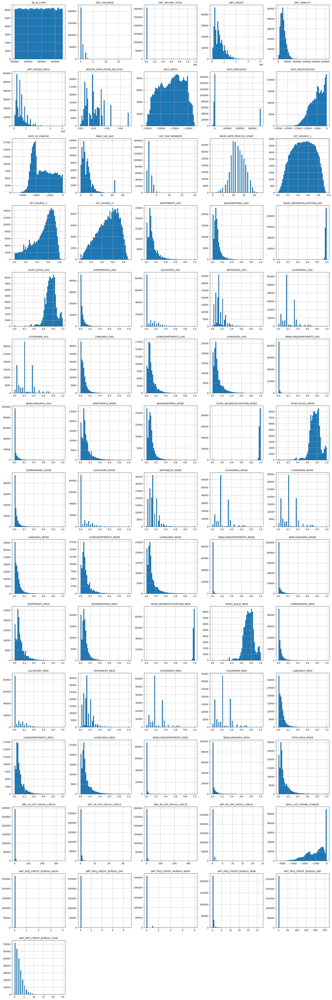

In [18]:
# for numerical feaures
# drop low flag columns
low_variance = [col for col in num_cols if df[col].nunique() <= 3]
filtered_num_cols = [col for col in num_cols if col not in low_variance]

import matplotlib.pyplot as plt
import math

n_cols = 5
n_rows = math.ceil(len(filtered_num_cols) / n_cols)

plt.figure(figsize=(20, n_rows * 4))

for i, col in enumerate(filtered_num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    df[col].dropna().hist(bins=50)
    plt.title(col, fontsize=10)
    plt.xlabel("")
    plt.ylabel("")

plt.tight_layout()
plt.show()

In [19]:
import pandas as pd

# Calculate skewness
skew_values = df[filtered_num_cols].skew().sort_values(ascending=False)

In [20]:
highly_skewed = skew_values[abs(skew_values) > 1]

print("Highly skewed columns:")
print(highly_skewed)

Highly skewed columns:
AMT_INCOME_TOTAL                391.559654
AMT_REQ_CREDIT_BUREAU_QRT       134.365776
AMT_REQ_CREDIT_BUREAU_DAY        27.043505
NONLIVINGAPARTMENTS_MODE         16.251819
NONLIVINGAPARTMENTS_MEDI         15.671995
NONLIVINGAPARTMENTS_AVG          15.541185
AMT_REQ_CREDIT_BUREAU_HOUR       14.534062
OBS_30_CNT_SOCIAL_CIRCLE         12.139598
OBS_60_CNT_SOCIAL_CIRCLE         12.070829
AMT_REQ_CREDIT_BUREAU_WEEK        9.293573
AMT_REQ_CREDIT_BUREAU_MON         7.804848
NONLIVINGAREA_AVG                 6.559012
NONLIVINGAREA_MODE                6.522451
NONLIVINGAREA_MEDI                6.508831
COMMONAREA_MODE                   5.620589
COMMONAREA_AVG                    5.457305
COMMONAREA_MEDI                   5.419238
DEF_60_CNT_SOCIAL_CIRCLE          5.277878
DEF_30_CNT_SOCIAL_CIRCLE          5.183518
LANDAREA_AVG                      4.458677
LANDAREA_MODE                     4.377027
LANDAREA_MEDI                     4.368292
BASEMENTAREA_AVG               

### skewness description
*     >+1--> Highly right-skewed
* < -1--> Highly left-skewed
* 0.5 to +1--> moderately right skewed
* -0.5 to -1--> moderately left skewed

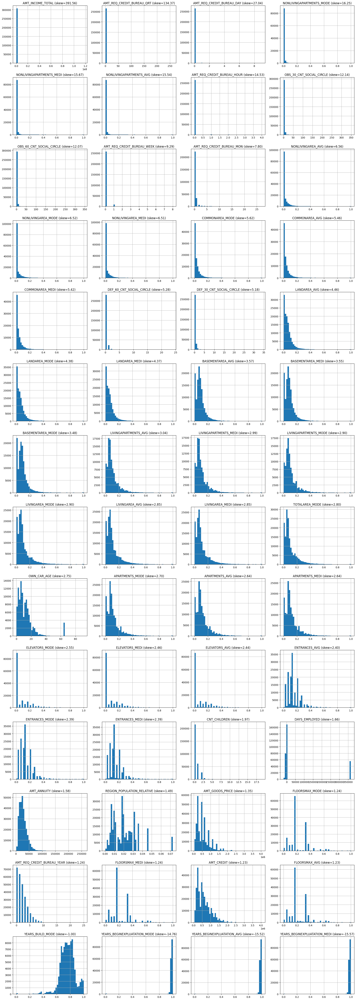

In [21]:
skewed_cols = highly_skewed.index.tolist()

n_cols = 4
n_rows = math.ceil(len(skewed_cols) / n_cols)

plt.figure(figsize=(20, n_rows * 4))

for i, col in enumerate(skewed_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    df[col].dropna().hist(bins=50)
    plt.title(f"{col} (skew={skew_values[col]:.2f})")
    plt.xlabel("")
    plt.ylabel("")

plt.tight_layout()
plt.show()

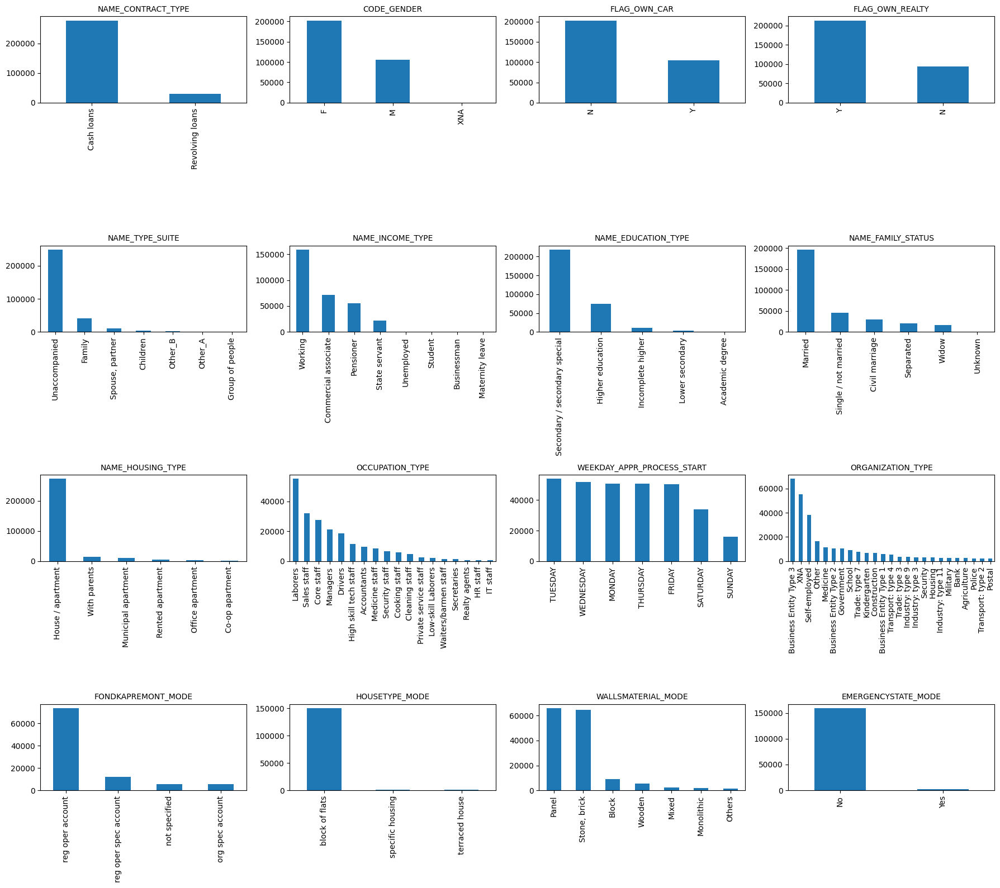

In [22]:
# for categorical features
import matplotlib.pyplot as plt
import math

# Grid size
n_cols = 4
n_rows = math.ceil(len(cat_cols) / n_cols)

plt.figure(figsize=(18, n_rows * 4))

for i, col in enumerate(cat_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    df[col].value_counts().head(25).plot(kind="bar")

    plt.title(col, fontsize=10)
    plt.xticks(rotation=90, fontsize=10)  
    plt.xlabel("")
    plt.ylabel("")

plt.tight_layout()
plt.show()

### bivariate analysis

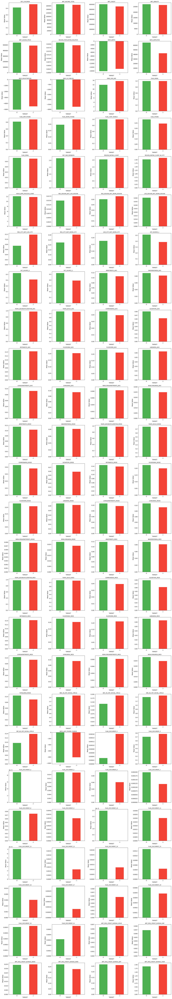

In [23]:
# for numerical features
import matplotlib.pyplot as plt
import math

exclude_cols = ["SK_ID_CURR", "TARGET"]
filtered_num_cols = [col for col in num_cols if col not in exclude_cols]

n_cols = 4
n_rows = math.ceil(len(filtered_num_cols) / n_cols)

plt.figure(figsize=(18, n_rows * 4))

for i, col in enumerate(filtered_num_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    df.groupby("TARGET")[col].mean().plot(kind="bar",color=["#4CAF50", "#F44336"])

    plt.title(col, fontsize=9)
    plt.xlabel("TARGET")
    plt.ylabel("Mean Value")

plt.tight_layout()
plt.show()

1: Defaulter,
0: Not Defaulter
* shows distribution between categories and target column
* more difference more predictable column 

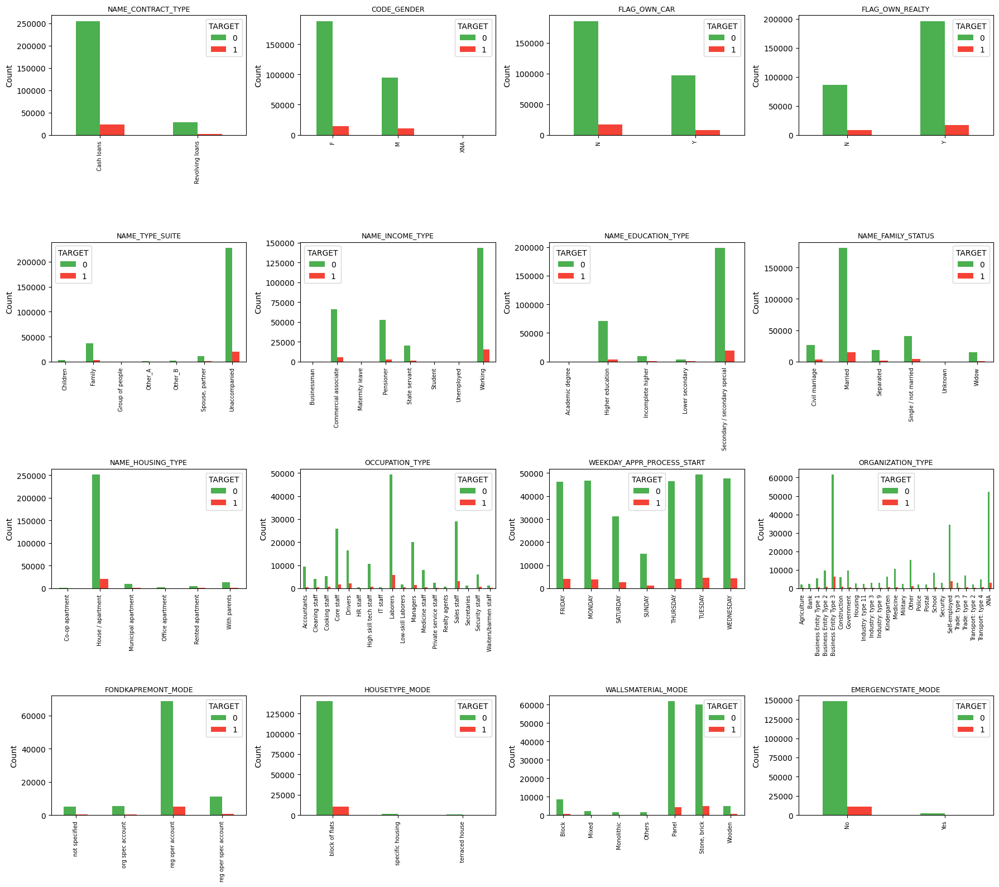

In [24]:
# for categorical features
import matplotlib.pyplot as plt
import math

exclude_cols = []  
filtered_cat_cols = [col for col in cat_cols if col not in exclude_cols]

n_cols = 4
n_rows = math.ceil(len(filtered_cat_cols) / n_cols)

plt.figure(figsize=(18, n_rows * 4))

for i, col in enumerate(filtered_cat_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    # Select top 10 categories only
    top_cats = df[col].value_counts().head(25).index

    temp = df[df[col].isin(top_cats)]

    temp.groupby([col, "TARGET"]).size().unstack().plot(
        kind="bar",
        stacked=False,
        color=["#4CAF50", "#F44336"],   # Green = No Default, Red = Default
        ax=plt.gca()
    )

    plt.title(col, fontsize=9)
    plt.xlabel("")
    plt.ylabel("Count")
    plt.xticks(rotation=90, fontsize=7)

plt.tight_layout()
plt.show()

above graph explains
* For each categorical feature Which categories have more defaults or not defaults
* helps to find Which are safer

### outlier detection

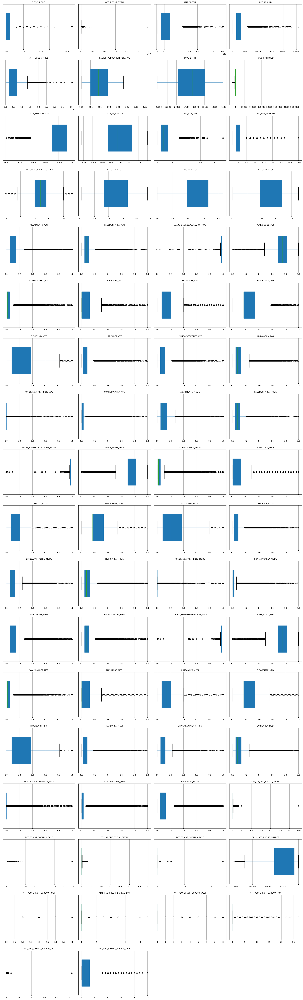

In [25]:
import matplotlib.pyplot as plt
import math

exclude_cols = ["SK_ID_CURR", "TARGET"]

filtered_num_cols = [
    col for col in num_cols 
    if col not in exclude_cols and df[col].nunique() > 3
]

n_cols = 4   
n_rows = math.ceil(len(filtered_num_cols) / n_cols)

plt.figure(figsize=(22, n_rows * 4))

for i, col in enumerate(filtered_num_cols, 1):
    ax = plt.subplot(n_rows, n_cols, i)

    df.boxplot(
        column=col,
        vert=False,
        ax=ax,
        widths=0.6,        
        patch_artist=True
    )

    # Column name ABOVE the plot
    ax.set_title(col, fontsize=10, pad=8)

    # Remove repeated labels
    ax.set_yticks([])
    ax.set_xlabel("")

plt.tight_layout()
plt.show()

In [26]:
import pandas as pd

filtered_num_cols = [
    col for col in num_cols 
    if col not in exclude_cols and df[col].nunique() > 3]

outlier_cols = []

for col in filtered_num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    if ((df[col] < lower) | (df[col] > upper)).any():
        outlier_cols.append(col)

print("Columns with outliers:")
print(outlier_cols)
print()
print("outlier columns:",len(outlier_cols))

Columns with outliers:
['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'HOUR_APPR_PROCESS_START', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDA

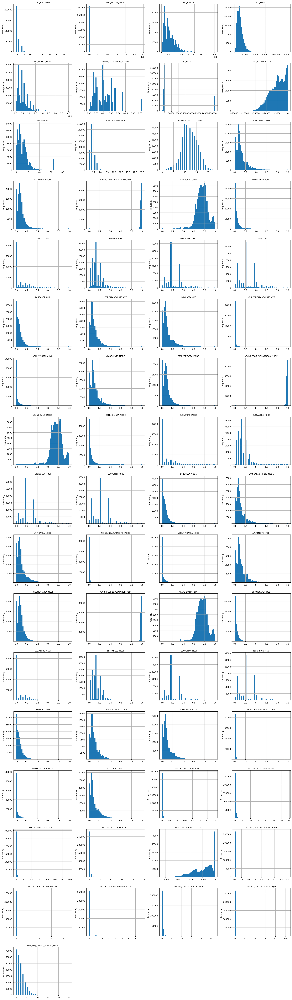

In [27]:
import matplotlib.pyplot as plt
import math

n_cols = 4
n_rows = math.ceil(len(outlier_cols) / n_cols)

plt.figure(figsize=(20, n_rows * 4))

for i, col in enumerate(outlier_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    df[col].dropna().hist(bins=50)

    plt.title(f"{col}", fontsize=9)
    plt.xlabel("")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

In [28]:
import pandas as pd

filtered_num_cols = [
    col for col in num_cols 
    if col not in exclude_cols and df[col].nunique() > 3]

outlier_summary = []

for col in filtered_num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outlier_mask = (df[col] < lower) | (df[col] > upper)
    outlier_count = outlier_mask.sum()
    outlier_percent = (outlier_count / len(df)) * 100

    if outlier_count > 0:
        outlier_summary.append({
            "column": col,
            "outlier count": outlier_count,
            "outlier percent": round(outlier_percent, 2)
        })

outlier_df = pd.DataFrame(outlier_summary).sort_values(
    by="outlier percent", ascending=True)

outlier_df

,column,outlier count,outlier percent
33,FLOORSMIN_MODE,320,0.10
47,FLOORSMIN_MEDI,344,0.11
19,FLOORSMIN_AVG,343,0.11
58,DAYS_LAST_PHONE_CHANGE,435,0.14
7,DAYS_REGISTRATION,659,0.21
...,...,...,...
57,DEF_60_CNT_SOCIAL_CIRCLE,25769,8.38
55,DEF_30_CNT_SOCIAL_CIRCLE,35166,11.44
62,AMT_REQ_CREDIT_BUREAU_MON,43759,14.23
63,AMT_REQ_CREDIT_BUREAU_QRT,50575,16.45


* there are total 65 columns having outliers 

In [29]:
len(outlier_df)

65

In [30]:
len(num_cols)

106

In [31]:
len(cat_cols)

16

In [32]:
len(df.columns)

122

# Data Preprocessing

In [33]:
import pandas as pd

app = pd.read_csv("data/processed/application_train.csv")
bureau = pd.read_csv("data/processed/bureau.csv")
bureau_bal = pd.read_csv("data/processed/bureau_balance.csv")

print(app.shape, bureau.shape, bureau_bal.shape)

(307511, 122) (1716428, 17) (27299925, 3)


In [34]:
bureau_bal.head(6)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
5,5715448,-5,C


In [35]:
bureau_bal['STATUS'].unique()

array(['C', '0', 'X', '1', '2', '3', '5', '4'], dtype=object)

### aggregation of bureau_balance file

In [36]:
# Aggregate bureau_balance Monthly Status per Credit
bureau_baalance_agg = bureau_bal.groupby("SK_ID_BUREAU").agg({
    "MONTHS_BALANCE": ["min", "max"],
    "STATUS": "nunique"})

bureau_baalance_agg.columns = ["BB_" + "_".join(col) for col in bureau_baalance_agg.columns]
bureau_baalance_agg.head(8)

,BB_MONTHS_BALANCE_min,BB_MONTHS_BALANCE_max,BB_STATUS_nunique
SK_ID_BUREAU,,,
5001709,-96,0,2
5001710,-82,0,3
5001711,-3,0,2
5001712,-18,0,2
5001713,-21,0,1
5001714,-14,0,1
5001715,-59,0,1
5001716,-85,0,3


### briefly Interpretation
for 5001709 SK_ID_BUREAU
* 96--> 8 years loan history
* 0--> recent loan history
* 2--> 2 unique status count means tells about how stable/unstable payments are 

In [37]:
# Merge bureau balance file into bureau file
bureau = bureau.merge(bureau_baalance_agg, on="SK_ID_BUREAU", how="left")
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,BB_MONTHS_BALANCE_min,BB_MONTHS_BALANCE_max,BB_STATUS_nunique
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN,NaN,NaN,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN,NaN,NaN,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN,NaN,NaN,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN,NaN,NaN,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN,NaN,NaN,NaN


In [38]:
# Aggregate Bureau to Customer Level
bureau_agg = bureau.groupby("SK_ID_CURR").agg({

    # Time / Recency
    "DAYS_CREDIT": ["mean", "min", "max"],
    "DAYS_CREDIT_ENDDATE": ["mean", "max"],
    "DAYS_ENDDATE_FACT": ["mean", "min"],
    "DAYS_CREDIT_UPDATE": ["mean", "max"],

    # Overdue / Risk
    "CREDIT_DAY_OVERDUE": ["mean", "max"],
    "AMT_CREDIT_MAX_OVERDUE": ["mean", "max"],
    "AMT_CREDIT_SUM_OVERDUE": ["sum", "max"],

    # Credit Amounts
    "AMT_CREDIT_SUM": ["mean", "sum", "max"],
    "AMT_CREDIT_SUM_DEBT": ["mean", "sum", "max"],
    "AMT_CREDIT_SUM_LIMIT": ["mean", "max"],
    "AMT_ANNUITY": ["mean", "max"],

    # Credit Extensions
    "CNT_CREDIT_PROLONG": ["sum", "max"],

    # Credit History Quality
    "BB_STATUS_nunique": ["mean"],

    # Number of Loans
    "SK_ID_BUREAU": "count"
})

# Rename columns
bureau_agg.columns = ["BUREAU_" + "_".join(col) for col in bureau_agg.columns]

In [39]:
bureau_agg.head()

,BUREAU_DAYS_CREDIT_mean,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_AMT_ANNUITY_mean,BUREAU_AMT_ANNUITY_max,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_BB_STATUS_nunique_mean,BUREAU_SK_ID_BUREAU_count
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,-735.000000,-1572,-49,82.428571,1778.0,-825.500000,-1328.0,-93.142857,-6,0.0,0,NaN,NaN,0.0,0.0,207623.571429,1453365.000,378000.0,85240.928571,596686.5,373239.0,0.00000,0.000,3545.357143,10822.5,0,0,2.428571,7
100002,-874.000000,-1437,-103,-349.000000,780.0,-697.500000,-1185.0,-499.875000,-7,0.0,0,1681.029,5043.645,0.0,0.0,108131.945625,865055.565,450000.0,49156.200000,245781.0,245781.0,7997.14125,31988.565,0.000000,0.0,0,0,3.250000,8
100003,-1400.750000,-2586,-606,-544.500000,1216.0,-1097.333333,-2131.0,-816.000000,-43,0.0,0,0.000,0.000,0.0,0.0,254350.125000,1017400.500,810000.0,0.000000,0.0,0.0,202500.00000,810000.000,NaN,NaN,0,0,NaN,4
100004,-867.000000,-1326,-408,-488.500000,-382.0,-532.500000,-683.0,-532.000000,-382,0.0,0,0.000,0.000,0.0,0.0,94518.900000,189037.800,94537.8,0.000000,0.0,0.0,0.00000,0.000,NaN,NaN,0,0,NaN,2
100005,-190.666667,-373,-62,439.333333,1324.0,-123.000000,-123.0,-54.333333,-11,0.0,0,0.000,0.000,0.0,0.0,219042.000000,657126.000,568800.0,189469.500000,568408.5,543087.0,0.00000,0.000,1420.500000,4261.5,0,0,2.000000,3


In [40]:
# Merge with Main Dataset
app = app.merge(bureau_agg, on="SK_ID_CURR", how="left")

### Aggregation of previous application file

In [41]:
import pandas as pd

prev = pd.read_csv("data/processed/previous_application.csv")
print(prev.shape)

(1670214, 37)


In [42]:
prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
prev_agg = prev.groupby("SK_ID_CURR").agg({

    "AMT_ANNUITY": ["mean", "max"],
    "AMT_APPLICATION": ["mean", "max"],
    "AMT_CREDIT": ["mean", "max"],
    "AMT_DOWN_PAYMENT": ["mean", "max"],
    "AMT_GOODS_PRICE": ["mean", "max"],

    "RATE_DOWN_PAYMENT": ["mean"],
    "RATE_INTEREST_PRIMARY": ["mean"],
    "RATE_INTEREST_PRIVILEGED": ["mean"],

    "DAYS_DECISION": ["mean", "max"],
    "DAYS_FIRST_DRAWING": ["mean"],
    "DAYS_FIRST_DUE": ["mean"],
    "DAYS_LAST_DUE_1ST_VERSION": ["mean"],
    "DAYS_LAST_DUE": ["mean"],
    "DAYS_TERMINATION": ["mean"],

    "CNT_PAYMENT": ["mean", "max"],

    "NFLAG_INSURED_ON_APPROVAL": ["mean"],
    "SK_ID_PREV": "count"
})

prev_agg.columns = ["PREV_" + "_".join(col) for col in prev_agg.columns]

In [44]:
prev_agg .head()

,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_max,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_max,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_RATE_INTEREST_PRIMARY_mean,PREV_RATE_INTEREST_PRIVILEGED_mean,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_max,PREV_DAYS_FIRST_DRAWING_mean,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_LAST_DUE_1ST_VERSION_mean,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_TERMINATION_mean,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_max,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_SK_ID_PREV_count
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,
100001,3951.000,3951.000,24835.50,24835.5,23787.00,23787.0,2520.0,2520.0,24835.5,24835.5,0.104326,NaN,NaN,-1740.0,-1740,365243.0,-1709.000000,-1499.000000,-1619.000000,-1612.000000,8.0,8.0,0.000000,1
100002,9251.775,9251.775,179055.00,179055.0,179055.00,179055.0,0.0,0.0,179055.0,179055.0,0.000000,NaN,NaN,-606.0,-606,365243.0,-565.000000,125.000000,-25.000000,-17.000000,24.0,24.0,0.000000,1
100003,56553.990,98356.995,435436.50,900000.0,484191.00,1035882.0,3442.5,6885.0,435436.5,900000.0,0.050030,NaN,NaN,-1305.0,-746,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,10.0,12.0,0.666667,3
100004,5357.250,5357.250,24282.00,24282.0,20106.00,20106.0,4860.0,4860.0,24282.0,24282.0,0.212008,NaN,NaN,-815.0,-815,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,4.0,4.0,0.000000,1
100005,4813.200,4813.200,22308.75,44617.5,20076.75,40153.5,4464.0,4464.0,44617.5,44617.5,0.108964,NaN,NaN,-536.0,-315,365243.0,-706.000000,-376.000000,-466.000000,-460.000000,12.0,12.0,0.000000,2


In [45]:
prev_agg.shape

(338857, 24)

In [46]:
# Merge with Main Dataset
app = app.merge(prev_agg, on="SK_ID_CURR", how="left")

### Aggregation of installments_payments file

In [47]:
import pandas as pd

inst = pd.read_csv("data/processed/installments_payments.csv")
print(inst.shape)

(13605401, 8)


In [48]:
inst.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [49]:
# Payment delay (positive = late, negative = early)
inst["PAYMENT_DELAY"] = inst["DAYS_ENTRY_PAYMENT"] - inst["DAYS_INSTALMENT"]

# Payment ratio (1 = full payment, <1 = partial payment)
inst["PAYMENT_RATIO"] = inst["AMT_PAYMENT"] / inst["AMT_INSTALMENT"]

In [50]:
inst_agg = inst.groupby("SK_ID_CURR").agg({

    # Timing behavior
    "PAYMENT_DELAY": ["mean", "max"],

    # Payment behavior
    "PAYMENT_RATIO": ["mean", "min"],

    # Amounts
    "AMT_PAYMENT": ["mean", "sum", "max"],
    "AMT_INSTALMENT": ["mean", "sum", "max"],

    # Installment structure
    "NUM_INSTALMENT_NUMBER": ["max"],
    "NUM_INSTALMENT_VERSION": ["nunique"],

    # Experience
    "SK_ID_PREV": "nunique"
})

# Rename columns
inst_agg.columns = ["INST_" + "_".join(col) for col in inst_agg.columns]

inst_agg.head()

,INST_PAYMENT_DELAY_mean,INST_PAYMENT_DELAY_max,INST_PAYMENT_RATIO_mean,INST_PAYMENT_RATIO_min,INST_AMT_PAYMENT_mean,INST_AMT_PAYMENT_sum,INST_AMT_PAYMENT_max,INST_AMT_INSTALMENT_mean,INST_AMT_INSTALMENT_sum,INST_AMT_INSTALMENT_max,INST_NUM_INSTALMENT_NUMBER_max,INST_NUM_INSTALMENT_VERSION_nunique,INST_SK_ID_PREV_nunique
SK_ID_CURR,,,,,,,,,,,,,
100001,-7.285714,11.0,1.0,1.0,5885.132143,41195.925,17397.900,5885.132143,41195.925,17397.900,4,2,2
100002,-20.421053,-12.0,1.0,1.0,11559.247105,219625.695,53093.745,11559.247105,219625.695,53093.745,19,2,1
100003,-7.160000,-1.0,1.0,1.0,64754.586000,1618864.650,560835.360,64754.586000,1618864.650,560835.360,12,2,3
100004,-7.666667,-3.0,1.0,1.0,7096.155000,21288.465,10573.965,7096.155000,21288.465,10573.965,3,2,1
100005,-23.555556,1.0,1.0,1.0,6240.205000,56161.845,17656.245,6240.205000,56161.845,17656.245,9,2,1


In [51]:
# Merge with Main Dataset
app = app.merge(inst_agg, on="SK_ID_CURR", how="left")
app.shape

(307511, 188)

### Aggregation of credit card balance file 

In [52]:
import pandas as pd

cc = pd.read_csv("data/processed/credit_card_balance.csv")
print(cc.shape)

(3840312, 23)


In [53]:
cc.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [54]:
# Credit utilization ratio
cc["UTILIZATION"] = cc["AMT_BALANCE"] / cc["AMT_CREDIT_LIMIT_ACTUAL"]

# Payment ratio
cc["PAYMENT_RATIO"] = cc["AMT_PAYMENT_CURRENT"] / cc["AMT_TOTAL_RECEIVABLE"]

#### Utilization Ratio 
to understand How much of the available credit the customer is using
* High utilization--> financial stress
* Low utilization--> healthy credit behavior

### Payment Ratio
tells How much of the due amount the customer actually paid

* Low ratio = repayment problems
* High ratio = financial discipline

In [55]:
cc_agg = cc.groupby("SK_ID_CURR").agg({

    # Balances & Debt
    "AMT_BALANCE": ["mean", "max"],
    "AMT_TOTAL_RECEIVABLE": ["mean", "max"],
    "AMT_RECEIVABLE_PRINCIPAL": ["mean", "max"],

    # Credit Limit
    "AMT_CREDIT_LIMIT_ACTUAL": ["mean", "max"],

    # Payments
    "AMT_PAYMENT_CURRENT": ["mean", "sum", "max"],
    "AMT_PAYMENT_TOTAL_CURRENT": ["mean", "sum", "max"],

    # Delays
    "SK_DPD": ["mean", "max"],
    "SK_DPD_DEF": ["mean", "max"],

    # Usage Frequency
    "CNT_DRAWINGS_CURRENT": ["mean", "max"],
    "CNT_INSTALMENT_MATURE_CUM": ["mean", "max"],

    # Drawings Behavior (Amounts)
    "AMT_DRAWINGS_ATM_CURRENT": ["mean", "max"],
    "AMT_DRAWINGS_OTHER_CURRENT": ["mean", "max"],
    "AMT_DRAWINGS_POS_CURRENT": ["mean", "max"],

    # Drawings Count (Now including BOTH)
    "CNT_DRAWINGS_ATM_CURRENT": ["mean", "max"],
    "CNT_DRAWINGS_OTHER_CURRENT": ["mean", "max"],
    "CNT_DRAWINGS_POS_CURRENT": ["mean", "max"],

    # Time Reference
    "MONTHS_BALANCE": ["min", "max"],

    # Derived Ratios
    "UTILIZATION": ["mean", "max"],
    "PAYMENT_RATIO": ["mean", "min"],

    # Experience
    "SK_ID_PREV": "nunique"
})

# Rename columns
cc_agg.columns = ["CC_" + "_".join(col) for col in cc_agg.columns]

In [56]:
cc_agg.head()

,CC_AMT_BALANCE_mean,CC_AMT_BALANCE_max,CC_AMT_TOTAL_RECEIVABLE_mean,CC_AMT_TOTAL_RECEIVABLE_max,CC_AMT_RECEIVABLE_PRINCIPAL_mean,CC_AMT_RECEIVABLE_PRINCIPAL_max,CC_AMT_CREDIT_LIMIT_ACTUAL_mean,CC_AMT_CREDIT_LIMIT_ACTUAL_max,CC_AMT_PAYMENT_CURRENT_mean,CC_AMT_PAYMENT_CURRENT_sum,CC_AMT_PAYMENT_CURRENT_max,CC_AMT_PAYMENT_TOTAL_CURRENT_mean,CC_AMT_PAYMENT_TOTAL_CURRENT_sum,CC_AMT_PAYMENT_TOTAL_CURRENT_max,CC_SK_DPD_mean,CC_SK_DPD_max,CC_SK_DPD_DEF_mean,CC_SK_DPD_DEF_max,CC_CNT_DRAWINGS_CURRENT_mean,CC_CNT_DRAWINGS_CURRENT_max,CC_CNT_INSTALMENT_MATURE_CUM_mean,CC_CNT_INSTALMENT_MATURE_CUM_max,CC_AMT_DRAWINGS_ATM_CURRENT_mean,CC_AMT_DRAWINGS_ATM_CURRENT_max,CC_AMT_DRAWINGS_OTHER_CURRENT_mean,CC_AMT_DRAWINGS_OTHER_CURRENT_max,CC_AMT_DRAWINGS_POS_CURRENT_mean,CC_AMT_DRAWINGS_POS_CURRENT_max,CC_CNT_DRAWINGS_ATM_CURRENT_mean,CC_CNT_DRAWINGS_ATM_CURRENT_max,CC_CNT_DRAWINGS_OTHER_CURRENT_mean,CC_CNT_DRAWINGS_OTHER_CURRENT_max,CC_CNT_DRAWINGS_POS_CURRENT_mean,CC_CNT_DRAWINGS_POS_CURRENT_max,CC_MONTHS_BALANCE_min,CC_MONTHS_BALANCE_max,CC_UTILIZATION_mean,CC_UTILIZATION_max,CC_PAYMENT_RATIO_mean,CC_PAYMENT_RATIO_min,CC_SK_ID_PREV_nunique
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100006,0.000000,0.00,0.000000,0.00,0.000000,0.0,270000.000000,270000,NaN,0.00,NaN,0.000000,0.000,0.0,0.000000,0,0.000000,0,0.000000,0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6,-1,0.000000,0.00000,NaN,NaN,1
100011,54482.111149,189000.00,54433.179122,189000.00,52402.088919,180000.0,164189.189189,180000,4843.064189,358386.75,55485.0,4520.067568,334485.000,55485.0,0.000000,0,0.000000,0,0.054054,4,25.767123,33.0,2432.432432,180000.0,0.0,0.0,0.0,0.0,0.054054,4.0,0.0,0.0,0.0,0.0,-75,-2,0.302678,1.05000,inf,-98.490295,1
100013,18159.919219,161420.22,18101.079844,161420.22,17255.559844,157500.0,131718.750000,157500,7168.346250,688161.24,153675.0,6817.172344,654448.545,153675.0,0.010417,1,0.010417,1,0.239583,7,18.719101,22.0,6350.000000,157500.0,0.0,0.0,0.0,0.0,0.255556,7.0,0.0,0.0,0.0,0.0,-96,-1,0.115301,1.02489,inf,-1.000000,1
100021,0.000000,0.00,0.000000,0.00,0.000000,0.0,675000.000000,675000,NaN,0.00,NaN,0.000000,0.000,0.0,0.000000,0,0.000000,0,0.000000,0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-18,-2,0.000000,0.00000,NaN,NaN,1
100023,0.000000,0.00,0.000000,0.00,0.000000,0.0,135000.000000,225000,NaN,0.00,NaN,0.000000,0.000,0.0,0.000000,0,0.000000,0,0.000000,0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-11,-4,0.000000,0.00000,NaN,NaN,1


In [57]:
# Merge with Main Dataset
app = app.merge(cc_agg, on="SK_ID_CURR", how="left")
app.shape

(307511, 229)

### aggregation of posh cash balance file

In [58]:
import pandas as pd

pos= pd.read_csv("data/processed/POS_CASH_balance.csv")
print(pos.shape)

(10001358, 8)


In [59]:
pos.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [60]:
# Installments remaining ratio
pos["INSTALMENT_REMAIN_RATIO"] = pos["CNT_INSTALMENT_FUTURE"] / pos["CNT_INSTALMENT"]

# Late payment indicator
pos["LATE_PAYMENT"] = (pos["SK_DPD"] > 0).astype(int)

#### INSTALMENT_REMAIN_RATIO
tells much of the loan is still unpaid

* Low ratio → Loan almost finished
* High ratio → Big obligation still remaining
#### LATE_PAYMENT
tells delay happened or not 

* SK_DPD > 0 → Late payment 
* SK_DPD = 0 → On-time

In [61]:
pos_agg = pos.groupby("SK_ID_CURR").agg({

    # Installment structure
    "CNT_INSTALMENT": ["mean", "max"],
    "CNT_INSTALMENT_FUTURE": ["mean", "max"],

    # Delays
    "SK_DPD": ["mean", "max"],
    "SK_DPD_DEF": ["mean", "max"],

    # Time reference
    "MONTHS_BALANCE": ["min", "max"],

    # Derived features
    "INSTALMENT_REMAIN_RATIO": ["mean", "max"],
    "LATE_PAYMENT": ["mean"],

    # Contract behavior
    "NAME_CONTRACT_STATUS": "nunique",

    # Experience
    "SK_ID_PREV": "nunique"
})

# Rename columns
pos_agg.columns = ["POS_" + "_".join(col) for col in pos_agg.columns]

In [62]:
pos_agg.head()

,POS_CNT_INSTALMENT_mean,POS_CNT_INSTALMENT_max,POS_CNT_INSTALMENT_FUTURE_mean,POS_CNT_INSTALMENT_FUTURE_max,POS_SK_DPD_mean,POS_SK_DPD_max,POS_SK_DPD_DEF_mean,POS_SK_DPD_DEF_max,POS_MONTHS_BALANCE_min,POS_MONTHS_BALANCE_max,POS_INSTALMENT_REMAIN_RATIO_mean,POS_INSTALMENT_REMAIN_RATIO_max,POS_LATE_PAYMENT_mean,POS_NAME_CONTRACT_STATUS_nunique,POS_SK_ID_PREV_nunique
SK_ID_CURR,,,,,,,,,,,,,,,
100001,4.000000,4.0,1.444444,4.0,0.777778,7,0.777778,7,-96,-53,0.361111,1.0,0.111111,2,2
100002,24.000000,24.0,15.000000,24.0,0.000000,0,0.000000,0,-19,-1,0.625000,1.0,0.000000,1,1
100003,10.107143,12.0,5.785714,12.0,0.000000,0,0.000000,0,-77,-18,0.544643,1.0,0.000000,2,3
100004,3.750000,4.0,2.250000,4.0,0.000000,0,0.000000,0,-27,-24,0.562500,1.0,0.000000,2,1
100005,11.700000,12.0,7.200000,12.0,0.000000,0,0.000000,0,-25,-15,0.600000,1.0,0.000000,3,1


In [63]:
# Merge with Main Dataset
app = app.merge(pos_agg, on="SK_ID_CURR", how="left")
app.shape

(307511, 244)

In [64]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [65]:
df.shape

(307511, 122)

In [66]:
app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BUREAU_DAYS_CREDIT_mean,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_AMT_ANNUITY_mean,BUREAU_AMT_ANNUITY_max,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_BB_STATUS_nunique_mean,BUREAU_SK_ID_BUREAU_count,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_max,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_max,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_RATE_INTEREST_PRIMARY_mean,PREV_RATE_INTEREST_PRIVILEGED_mean,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_max,PREV_DAYS_FIRST_DRAWING_mean,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_LAST_DUE_1ST_VERSION_mean,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_TERMINATION_mean,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_max,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_SK_ID_PREV_count,INST_PAYMENT_DELAY_mean,INST_PAYMENT_DELAY_max,INST_PAYMENT_RATIO_mean,INST_PAYMENT_RATIO_min,INST_AMT_PAYMENT_mean,INST_AMT_PAYMENT_sum,INST_AMT_PAYMENT_max,INST_AMT_INSTALMENT_mean,INST_AMT_INSTALMENT_sum,INST_AMT_INSTALMENT_max,INST_NUM_INSTALMENT_NUMBER_max,INST_NUM_INSTALMENT_VERSION_nunique,INST_SK_ID_PREV_nunique,C

In [67]:
app.shape

(307511, 244)

# Null values handling

In [68]:
import pandas as pd

# Calculate missing values
missing = app.isnull().sum()
missing_percent = (missing / len(app)) * 100

missing_df = pd.DataFrame({
    "Missing Count": missing,
    "Missing Percent": missing_percent
}).sort_values(by="Missing Percent", ascending=False)

missing_df

,Missing Count,Missing Percent
PREV_RATE_INTEREST_PRIMARY_mean,302902,98.501192
PREV_RATE_INTEREST_PRIVILEGED_mean,302902,98.501192
CC_PAYMENT_RATIO_mean,246509,80.162661
CC_PAYMENT_RATIO_min,246509,80.162661
CC_AMT_PAYMENT_CURRENT_max,246451,80.143800
...,...,...
REG_CITY_NOT_LIVE_CITY,0,0.000000
LIVE_REGION_NOT_WORK_REGION,0,0.000000
REG_REGION_NOT_WORK_REGION,0,0.000000
REG_REGION_NOT_LIVE_REGION,0,0.000000


In [69]:
missing_df.head(10)

,Missing Count,Missing Percent
PREV_RATE_INTEREST_PRIMARY_mean,302902,98.501192
PREV_RATE_INTEREST_PRIVILEGED_mean,302902,98.501192
CC_PAYMENT_RATIO_mean,246509,80.162661
CC_PAYMENT_RATIO_min,246509,80.162661
CC_AMT_PAYMENT_CURRENT_max,246451,80.143800
CC_AMT_PAYMENT_CURRENT_mean,246451,80.143800
CC_CNT_DRAWINGS_ATM_CURRENT_max,246371,80.117784
CC_CNT_DRAWINGS_POS_CURRENT_mean,246371,80.117784
CC_CNT_DRAWINGS_OTHER_CURRENT_max,246371,80.117784
CC_CNT_DRAWINGS_OTHER_CURRENT_mean,246371,80.117784


In [70]:
missing_df = pd.DataFrame({
    "missing_count": app.isnull().sum(),
    "missing_percent": app.isnull().mean() * 100
}).sort_values(by="missing_percent", ascending=False)

drop_80 = missing_df[missing_df["missing_percent"] > 80].index.tolist()

app = app.drop(columns=drop_80)

print("Dropped columns >80% missing values:", len(drop_80))

Dropped columns >80% missing values: 18


### description
Why delete columns greater than 80% missing values because
* Model cannot learn from near-empty features
* Adds noise

In [71]:
mid_missing = missing_df[
    (missing_df["missing_percent"] > 60) &
    (missing_df["missing_percent"] <= 80)
].index.tolist()

In [72]:
len(mid_missing)

45

In [73]:
meaningful = []

for col in mid_missing:
    flag = col + "_MISS"
    app[flag] = app[col].isnull().astype(int)

    rates = app.groupby(flag)["TARGET"].mean()

    if len(rates) == 2:
        diff = abs(rates.iloc[0] - rates.iloc[1])
        if diff > 0.03:   # strong signal
            meaningful.append(col)
            
print(meaningful)

[]


In [74]:
app = app.drop(columns=mid_missing)
print("Dropped mid-missing columns:", len(mid_missing))

Dropped mid-missing columns: 45


In [75]:
num_col = app.select_dtypes(include=["int64", "float64"]).columns
cat_col = app.select_dtypes(include=["object"]).columns

In [76]:
num_col = app.select_dtypes(include=["int64", "float64"]).columns

for col in num_col:
    app[col] = app[col].fillna(app[col].median())

In [77]:
for col in cat_col:
    app[col] = app[col].fillna(app[col].mode()[0])

In [78]:
total_nulls = app.isnull().sum().sum()
total_nulls

0

In [79]:
app.shape

(307511, 226)

In [80]:
# duplicate values checking 
dup_count = app.duplicated().sum()
print("Total duplicate rows:", dup_count)

Total duplicate rows: 0


In [81]:
num_col = app.select_dtypes(include=["int64", "float64"]).columns
cat_col = app.select_dtypes(include=["object"]).columns

print("Numerical columns:", len(num_col))
print("Categorical columns:", len(cat_col))

Numerical columns: 166
Categorical columns: 15


In [82]:
num_col = app.select_dtypes(include=["int64", "float64"]).columns
print(num_col)

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'POS_SK_DPD_max', 'POS_SK_DPD_DEF_mean', 'POS_SK_DPD_DEF_max',
       'POS_MONTHS_BALANCE_min', 'POS_MONTHS_BALANCE_max',
       'POS_INSTALMENT_REMAIN_RATIO_mean', 'POS_INSTALMENT_REMAIN_RATIO_max',
       'POS_LATE_PAYMENT_mean', 'POS_NAME_CONTRACT_STATUS_nunique',
       'POS_SK_ID_PREV_nunique'],
      dtype='object', length=166)


In [83]:
"BUREAU_DAYS_CREDIT_mean" in app.columns

True

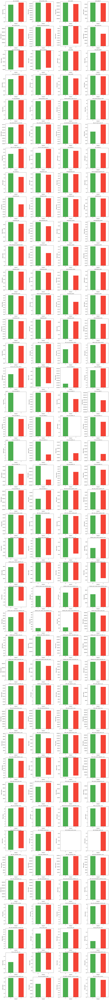

In [84]:
# for numerical features
import matplotlib.pyplot as plt
import math

exclude_cols = ["SK_ID_CURR", "TARGET"]
filtered_num_cols = [col for col in num_col if col not in exclude_cols]

n_cols = 4
n_rows = math.ceil(len(filtered_num_cols) / n_cols)

plt.figure(figsize=(18, n_rows * 4))

for i, col in enumerate(filtered_num_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    app.groupby("TARGET")[col].mean().plot(kind="bar",color=["#4CAF50", "#F44336"])

    plt.title(col, fontsize=9)
    plt.xlabel("TARGET")
    plt.ylabel("Mean Value")

plt.tight_layout()
plt.show()

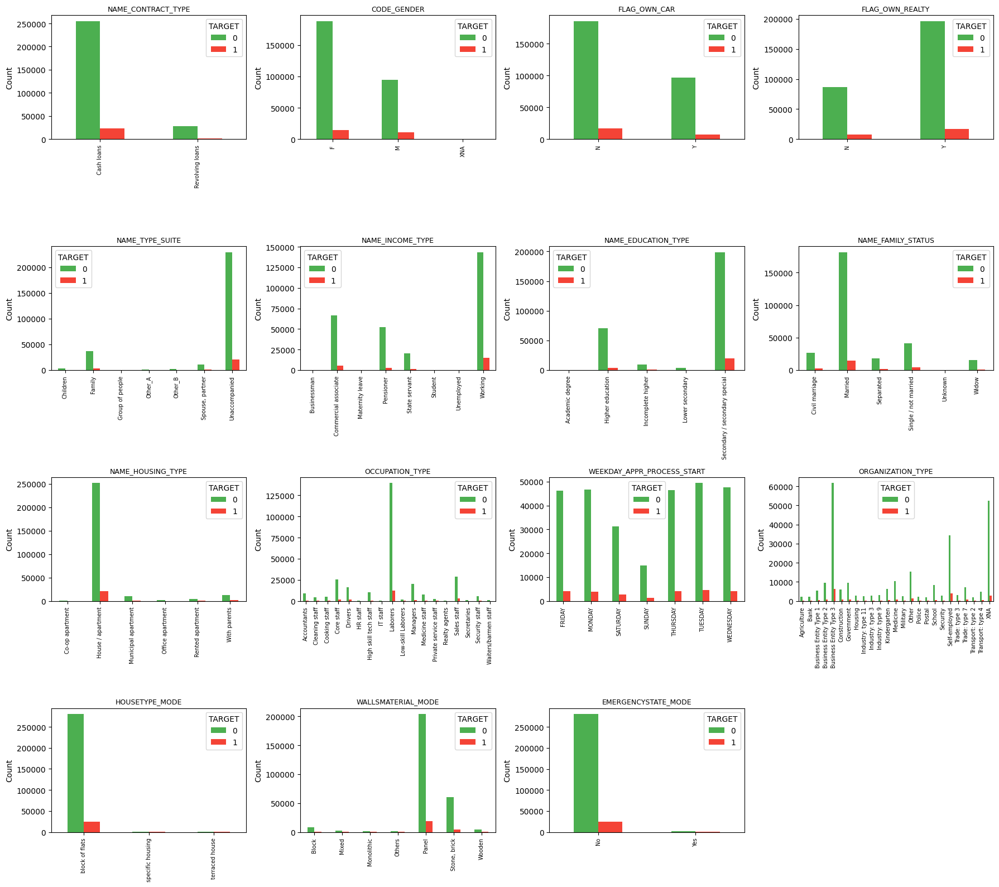

In [85]:
# for categorical features
import matplotlib.pyplot as plt
import math

exclude_cols = []  
filtered_cat_cols = [col for col in cat_col if col not in exclude_cols]

n_cols = 4
n_rows = math.ceil(len(filtered_cat_cols) / n_cols)

plt.figure(figsize=(18, n_rows * 4))

for i, col in enumerate(filtered_cat_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    # Select top 10 categories only
    top_cats = app[col].value_counts().head(25).index

    temp = app[app[col].isin(top_cats)]

    temp.groupby([col, "TARGET"]).size().unstack().plot(
        kind="bar",
        stacked=False,
        color=["#4CAF50", "#F44336"],   # Green = No Default, Red = Default
        ax=plt.gca()
    )

    plt.title(col, fontsize=9)
    plt.xlabel("")
    plt.ylabel("Count")
    plt.xticks(rotation=90, fontsize=7)

plt.tight_layout()
plt.show()

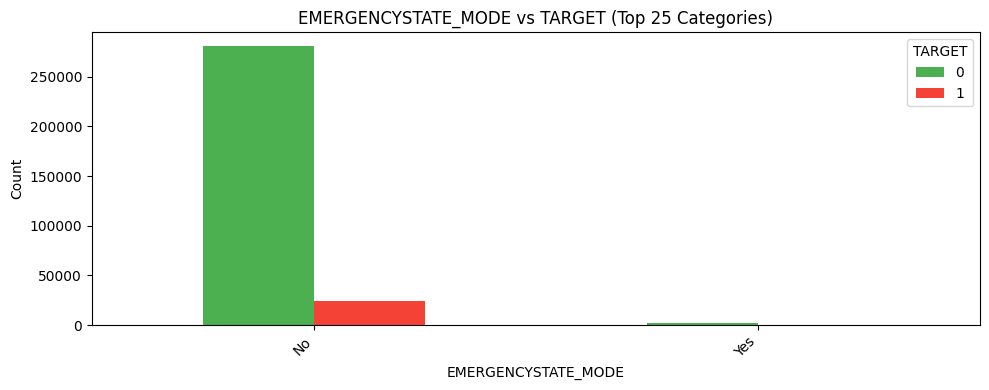

In [86]:
import matplotlib.pyplot as plt

# Top categories only (no row filtering)
top_cats = app[col].value_counts().head(25).index

# Aggregate counts WITHOUT copying full dataframe
agg = (
    app.loc[app[col].isin(top_cats), [col, "TARGET"]]
       .groupby([col, "TARGET"])
       .size()
       .unstack(fill_value=0)
)

# Plot
agg.plot(
    kind="bar",
    stacked=False,
    figsize=(10, 4),
    color=["#4CAF50", "#F44336"]
)

plt.title(f"{col} vs TARGET (Top 25 Categories)")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# outliers handling

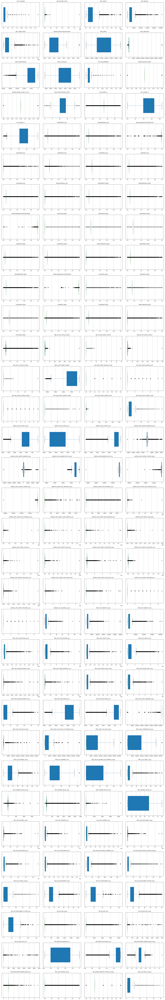

In [87]:
import matplotlib.pyplot as plt
import math

# Select numeric columns
num_cols = app.select_dtypes(include=["int64", "float64"]).columns
exclude_cols = ["SK_ID_CURR", "TARGET"]

# Remove ID, TARGET, and binary (2-unique) columns
filtered_num_cols = [
    col for col in num_cols 
    if col not in exclude_cols and app[col].nunique() > 2
]

n_cols = 4
n_rows = math.ceil(len(filtered_num_cols) / n_cols)

plt.figure(figsize=(22, n_rows * 4))

for i, col in enumerate(filtered_num_cols, 1):
    ax = plt.subplot(n_rows, n_cols, i)

    app.boxplot(
        column=col,
        vert=False,
        ax=ax,
        widths=0.6,
        patch_artist=True
    )

    ax.set_title(col, fontsize=10, pad=8)
    ax.set_yticks([])
    ax.set_xlabel("")

plt.tight_layout()
plt.show()

In [88]:
filtered_num_cols = [
    col for col in num_cols 
    if col not in exclude_cols and app[col].nunique() > 2
]

In [89]:
len(filtered_num_cols)

132

In [90]:
import pandas as pd

num_cols = app.select_dtypes(include=["int64", "float64"]).columns
exclude_cols = ["SK_ID_CURR", "TARGET"]

continuous_cols = [
    col for col in num_cols
    if col not in exclude_cols and app[col].nunique() > 2
]

outlier_cols = []

for col in continuous_cols:
    Q1 = app[col].quantile(0.25)
    Q3 = app[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    if ((app[col] < lower) | (app[col] > upper)).any():
        outlier_cols.append(col)

print("Columns with outliers:", outlier_cols)

Columns with outliers: ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_1', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'LANDAREA_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'LANDAREA_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'LANDAREA_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAREA_MEDI', 'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_C

* above are the only column names which contains outliers

In [91]:
len(outlier_cols)

126

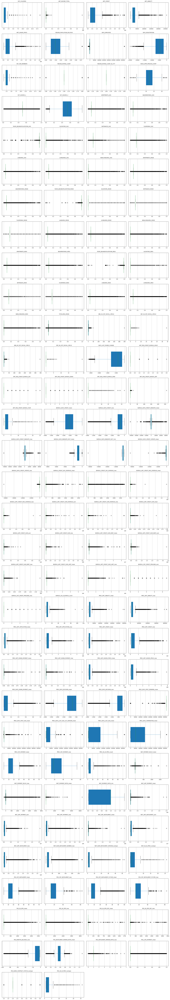

In [92]:
import matplotlib.pyplot as plt
import math

n_cols = 4
n_rows = math.ceil(len(outlier_cols) / n_cols)

plt.figure(figsize=(22, n_rows * 4))

for i, col in enumerate(outlier_cols, 1):
    ax = plt.subplot(n_rows, n_cols, i)

    app.boxplot(
        column=col,
        vert=False,
        ax=ax,
        widths=0.6,
        patch_artist=True
    )

    ax.set_title(col, fontsize=10, pad=8)
    ax.set_yticks([])
    ax.set_xlabel("")

plt.tight_layout()
plt.show()

In [93]:
len(outlier_cols)

126

In [94]:
app_before = app.copy()

In [95]:
# Apply capping
import numpy as np
for col in outlier_cols:
    Q1 = app[col].quantile(0.25)
    Q3 = app[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    app[col] = np.where(app[col] < lower, lower, app[col])
    app[col] = np.where(app[col] > upper, upper, app[col])

print("Capping is applied")

Capping is applied


* capping Limit extreme values without deleting data.Preserves valid data and Reduces extreme influence.

In [96]:
app[continuous_cols].skew().sort_values(ascending=False)

INST_NUM_INSTALMENT_VERSION_nunique    1.508674
CNT_CHILDREN                           1.478493
PREV_DAYS_LAST_DUE_1ST_VERSION_mean    1.300034
PREV_DAYS_TERMINATION_mean             1.278667
BUREAU_AMT_CREDIT_SUM_DEBT_sum         1.243339
                                         ...   
PREV_DAYS_DECISION_mean               -0.870158
BUREAU_DAYS_CREDIT_max                -1.049670
PREV_DAYS_DECISION_max                -1.064310
BUREAU_DAYS_CREDIT_UPDATE_max         -1.083844
POS_MONTHS_BALANCE_max                -1.227688
Length: 132, dtype: float64

In [97]:
skew_values = app[continuous_cols].skew()

pos_skew_cols = skew_values[skew_values > 1].index.tolist()
neg_skew_cols = skew_values[skew_values < -1].index.tolist()

print("Positive skewed columns:", pos_skew_cols)
print()
print("Negative skewed columns:", neg_skew_cols)

Positive skewed columns: ['CNT_CHILDREN', 'OBS_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'BUREAU_AMT_CREDIT_SUM_mean', 'BUREAU_AMT_CREDIT_SUM_sum', 'BUREAU_AMT_CREDIT_SUM_max', 'BUREAU_AMT_CREDIT_SUM_DEBT_mean', 'BUREAU_AMT_CREDIT_SUM_DEBT_sum', 'BUREAU_AMT_CREDIT_SUM_DEBT_max', 'PREV_AMT_APPLICATION_mean', 'PREV_AMT_APPLICATION_max', 'PREV_AMT_CREDIT_mean', 'PREV_AMT_CREDIT_max', 'PREV_AMT_DOWN_PAYMENT_mean', 'PREV_AMT_DOWN_PAYMENT_max', 'PREV_AMT_GOODS_PRICE_mean', 'PREV_AMT_GOODS_PRICE_max', 'PREV_RATE_DOWN_PAYMENT_mean', 'PREV_DAYS_LAST_DUE_1ST_VERSION_mean', 'PREV_DAYS_LAST_DUE_mean', 'PREV_DAYS_TERMINATION_mean', 'PREV_CNT_PAYMENT_max', 'INST_AMT_PAYMENT_mean', 'INST_AMT_PAYMENT_sum', 'INST_AMT_PAYMENT_max', 'INST_AMT_INSTALMENT_mean', 'INST_AMT_INSTALMENT_sum', 'INST_AMT_INSTALMENT_max', 'INST_NUM_INSTALMENT_NUMBER_max', 'INST_NUM_INSTALMENT_VERSION_nunique', 'INST_SK_ID_PREV_nunique', 'POS_CNT_INSTALMENT_FUTURE_mean']

Negative skewed colu

In [98]:
# logtransformation
import numpy as np

for col in pos_skew_cols:
    if (app[col] >= 0).all():   # ensure no negative values
        app[col] = np.log1p(app[col])

* only handles positive skewness.Reduces positive (right) skewness.

In [99]:
# yeo-johnson technique
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method="yeo-johnson")

app[neg_skew_cols] = pt.fit_transform(app[neg_skew_cols])

* Handle both positive and negative skew.

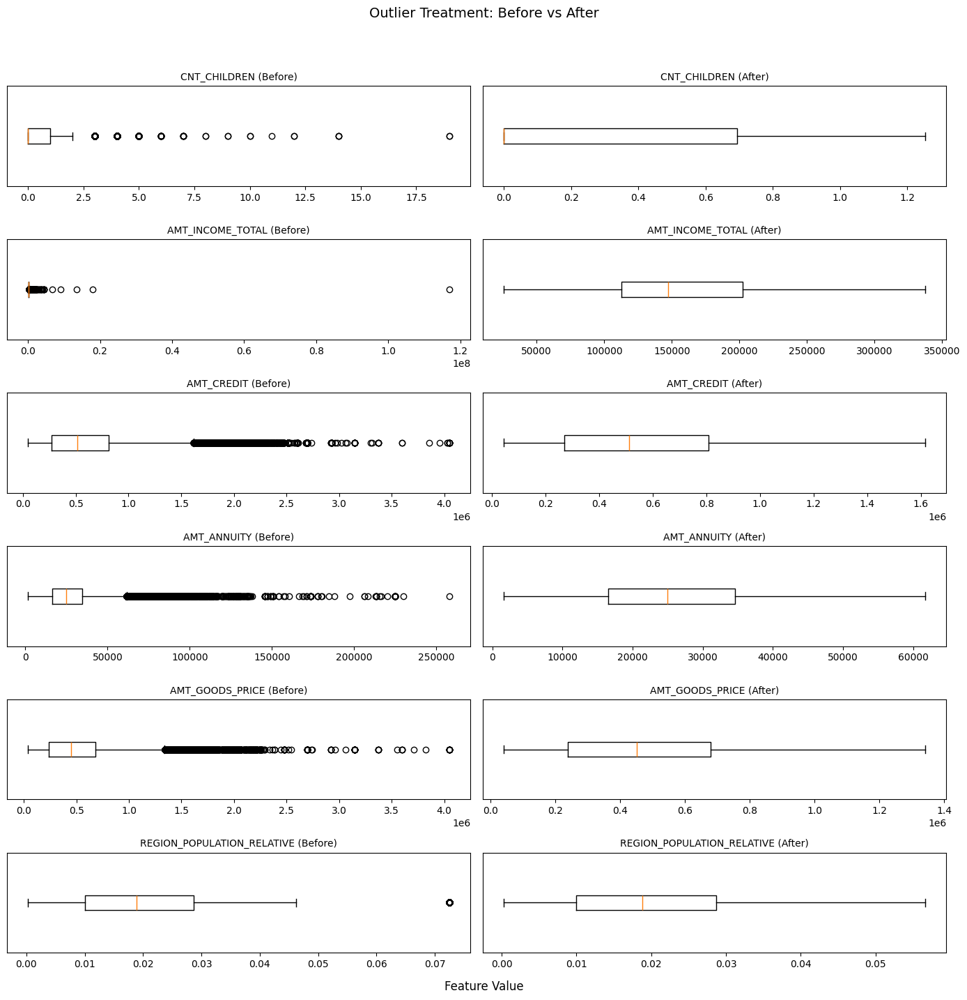

In [100]:
import math
import matplotlib.pyplot as plt

cols_to_check = outlier_cols[:6]   # limit to 6 for clarity

n_cols = 2
n_rows = len(cols_to_check)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 2.5))

for i, col in enumerate(cols_to_check):
    
    # Before
    axes[i, 0].boxplot(app_before[col].dropna(), vert=False)
    axes[i, 0].set_title(f"{col} (Before)", fontsize=10)
    axes[i, 0].set_yticks([])
    
    # After
    axes[i, 1].boxplot(app[col].dropna(), vert=False)
    axes[i, 1].set_title(f"{col} (After)", fontsize=10)
    axes[i, 1].set_yticks([])

# Global labels
fig.suptitle("Outlier Treatment: Before vs After", fontsize=14)
fig.text(0.5, 0.04, "Feature Value", ha="center", fontsize=12)

plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

In [101]:
app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BUREAU_DAYS_CREDIT_mean,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_SK_ID_BUREAU_count,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_max,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_max,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_max,PREV_DAYS_FIRST_DRAWING_mean,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_LAST_DUE_1ST_VERSION_mean,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_TERMINATION_mean,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_max,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_SK_ID_PREV_count,INST_PAYMENT_DELAY_mean,INST_PAYMENT_DELAY_max,INST_PAYMENT_RATIO_mean,INST_PAYMENT_RATIO_min,INST_AMT_PAYMENT_mean,INST_AMT_PAYMENT_sum,INST_AMT_PAYMENT_max,INST_AMT_INSTALMENT_mean,INST_AMT_INSTALMENT_sum,INST_AMT_INSTALMENT_max,INST_NUM_INSTALMENT_NUMBER_max,INST_NUM_INSTALMENT_VERSION_nunique,INST_SK_ID_PREV_nunique,POS_CNT_INSTALMENT_mean,POS_CNT_INSTALMENT_max,POS_CNT_INSTALMENT_FUTURE_mean,POS_CNT_INSTALMENT_FUTURE_max,POS_SK_DPD_mean,POS_SK_DPD_max,POS_SK_DPD_DEF_mean,POS_SK_DPD_DEF_max,POS_MONTHS_BALANCE_min,POS_MONTHS_BALANCE_max,POS_INSTALMENT_REMAIN_RATIO_mean,POS_INSTALMENT_REMAIN_RATIO_max,POS_LATE_PAYMENT_mean,POS_NAME_CONTRACT_STATUS_nunique,POS_SK_ID_PREV_nunique,BUREAU_AMT_ANNUITY_max_MISS,BUREAU_AMT_ANNUITY_mean_MISS,CC_UTILIZATION_mean_MISS,CC_UTIL

In [102]:
app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 226 entries, SK_ID_CURR to OWN_CAR_AGE_MISS
dtypes: float64(130), int32(45), int64(36), object(15)
memory usage: 477.4+ MB


In [103]:
app.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BUREAU_DAYS_CREDIT_mean,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_SK_ID_BUREAU_count,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_max,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_max,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_max,PREV_DAYS_FIRST_DRAWING_mean,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_LAST_DUE_1ST_VERSION_mean,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_TERMINATION_mean,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_max,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_SK_ID_PREV_count,INST_PAYMENT_DELAY_mean,INST_PAYMENT_DELAY_max,INST_PAYMENT_RATIO_mean,INST_PAYMENT_RATIO_min,INST_AMT_PAYMENT_mean,INST_AMT_PAYMENT_sum,INST_AMT_PAYMENT_max,INST_AMT_INSTALMENT_mean,INST_AMT_INSTALMENT_sum,INST_AMT_INSTALMENT_max,INST_NUM_INSTALMENT_NUMBER_max,INST_NUM_INSTALMENT_VERSION_nunique,INST_SK_ID_PREV_nunique,POS_CNT_INSTALMENT_mean,POS_CNT_INSTALMENT_max,POS_CNT_INSTALMENT_FUTURE_mean,POS_CNT_INSTALMENT_FUTURE_max,POS_SK_DPD_mean,POS_SK_DPD_max,POS_SK_DPD_DEF_mean,POS_SK_DPD_DEF_max,POS_MONTHS_BALANCE_min,POS_MONTHS_BALANCE_max,POS_INSTALMENT_REMAIN_RATIO_mean,POS_INSTALMENT_REMAIN_RATIO_max,POS_LATE_PAYMENT_mean,POS_NAME_CONTRACT_STATUS_nunique,POS_SK_ID_PREV_nunique,BUREAU_AMT_ANNUITY_max_MISS,BUREAU_AMT_ANNUITY_mean_MISS,CC_UTILIZATION_mean_MISS,CC_UTILIZATION_max_MISS,CC_AMT_TOTAL_RECEIVABLE_mean_MISS,CC_SK_DPD_DEF_mean_MISS,CC_SK_DPD_max_MISS,CC_SK_DPD_mean_MISS,CC_SK_DPD_DEF_max_MISS,CC_AMT_PAYMENT_TOTAL_CURRENT_sum_MISS,CC_CNT_DRAWINGS_CURRENT_mean_MISS,CC_CNT_DRAWINGS_CURRENT_max_MISS,CC_CNT_INSTALMENT_MATUR

In [104]:
missing = app.isnull().sum()
missing[missing > 0].sort_values(ascending=False)

Series([], dtype: int64)

In [105]:
total_nulls = app.isnull().sum().sum()
total_nulls

0

In [106]:
app

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BUREAU_DAYS_CREDIT_mean,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_SK_ID_BUREAU_count,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_max,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_max,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_max,PREV_DAYS_FIRST_DRAWING_mean,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_LAST_DUE_1ST_VERSION_mean,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_TERMINATION_mean,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_max,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_SK_ID_PREV_count,INST_PAYMENT_DELAY_mean,INST_PAYMENT_DELAY_max,INST_PAYMENT_RATIO_mean,INST_PAYMENT_RATIO_min,INST_AMT_PAYMENT_mean,INST_AMT_PAYMENT_sum,INST_AMT_PAYMENT_max,INST_AMT_INSTALMENT_mean,INST_AMT_INSTALMENT_sum,INST_AMT_INSTALMENT_max,INST_NUM_INSTALMENT_NUMBER_max,INST_NUM_INSTALMENT_VERSION_nunique,INST_SK_ID_PREV_nunique,POS_CNT_INSTALMENT_mean,POS_CNT_INSTALMENT_max,POS_CNT_INSTALMENT_FUTURE_mean,POS_CNT_INSTALMENT_FUTURE_max,POS_SK_DPD_mean,POS_SK_DPD_max,POS_SK_DPD_DEF_mean,POS_SK_DPD_DEF_max,POS_MONTHS_BALANCE_min,POS_MONTHS_BALANCE_max,POS_INSTALMENT_REMAIN_RATIO_mean,POS_INSTALMENT_REMAIN_RATIO_max,POS_LATE_PAYMENT_mean,POS_NAME_CONTRACT_STATUS_nunique,POS_SK_ID_PREV_nunique,BUREAU_AMT_ANNUITY_max_MISS,BUREAU_AMT_ANNUITY_mean_MISS,CC_UTILIZATION_mean_MISS,CC_UTIL

# Encoding

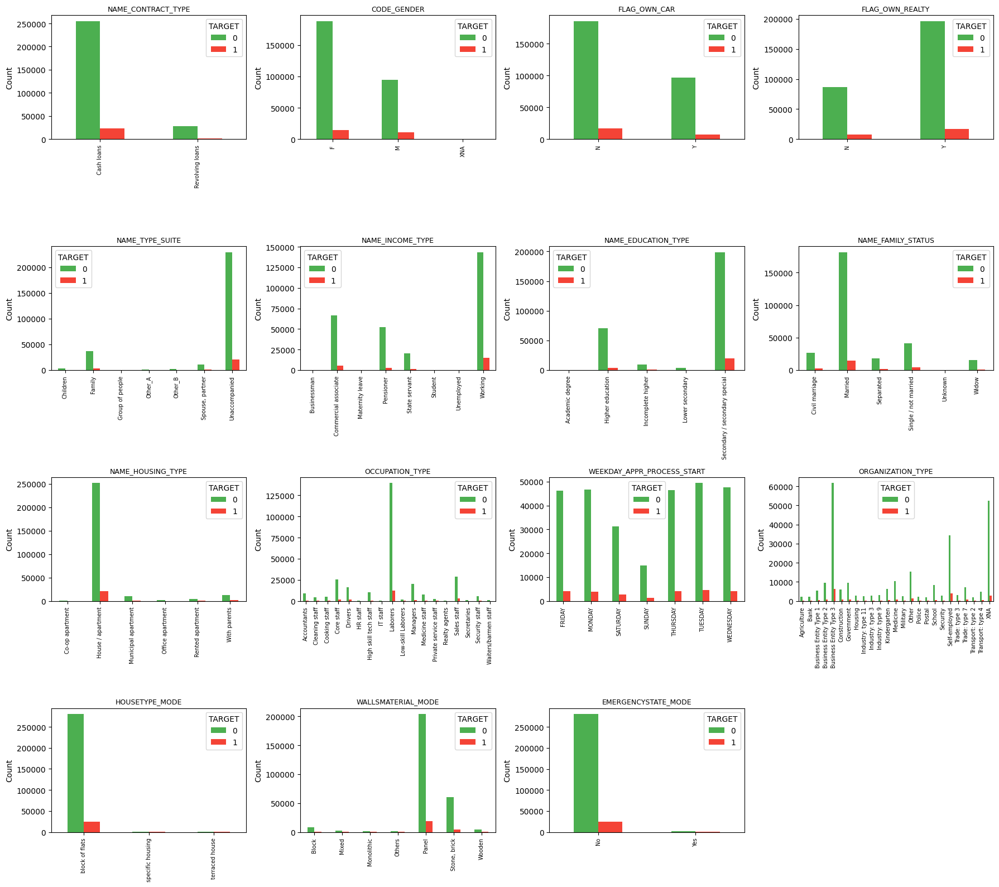

In [107]:
# for categorical 
import matplotlib.pyplot as plt
import math

exclude_cols = []  
filtered_cat_cols = [col for col in cat_col if col not in exclude_cols]

n_cols = 4
n_rows = math.ceil(len(filtered_cat_cols) / n_cols)

plt.figure(figsize=(18, n_rows * 4))

for i, col in enumerate(filtered_cat_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    # Select top 10 categories only
    top_cats = app[col].value_counts().head(25).index

    temp = app[app[col].isin(top_cats)]

    temp.groupby([col, "TARGET"]).size().unstack().plot(
        kind="bar",
        stacked=False,
        color=["#4CAF50", "#F44336"],   # Green = No Default, Red = Default
        ax=plt.gca()
    )

    plt.title(col, fontsize=9)
    plt.xlabel("")
    plt.ylabel("Count")
    plt.xticks(rotation=90, fontsize=7)

plt.tight_layout()
plt.show()

In [108]:
for col in cat_col:
    print("\n" + "-"*50)
    print(f"Column: {col}")
    print(app[col].value_counts())


--------------------------------------------------
Column: NAME_CONTRACT_TYPE
NAME_CONTRACT_TYPE
Cash loans         278232
Revolving loans     29279
Name: count, dtype: int64

--------------------------------------------------
Column: CODE_GENDER
CODE_GENDER
F      202448
M      105059
XNA         4
Name: count, dtype: int64

--------------------------------------------------
Column: FLAG_OWN_CAR
FLAG_OWN_CAR
N    202924
Y    104587
Name: count, dtype: int64

--------------------------------------------------
Column: FLAG_OWN_REALTY
FLAG_OWN_REALTY
Y    213312
N     94199
Name: count, dtype: int64

--------------------------------------------------
Column: NAME_TYPE_SUITE
NAME_TYPE_SUITE
Unaccompanied      249818
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: count, dtype: int64

--------------------------------------------------
Column: NAME_INCOME_TYPE
NAME_INCOME_TYPE


In [109]:
category_counts = app[cat_col].nunique().sort_values(ascending=False)
print(category_counts)

ORGANIZATION_TYPE             58
OCCUPATION_TYPE               18
NAME_INCOME_TYPE               8
NAME_TYPE_SUITE                7
WEEKDAY_APPR_PROCESS_START     7
WALLSMATERIAL_MODE             7
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
NAME_EDUCATION_TYPE            5
CODE_GENDER                    3
HOUSETYPE_MODE                 3
NAME_CONTRACT_TYPE             2
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
EMERGENCYSTATE_MODE            2
dtype: int64


In [110]:
low_card_cols = [col for col in cat_col if app[col].nunique() <= 10]
high_card_cols = [col for col in cat_col if app[col].nunique() > 10]

print("Low-cardinality:", len(low_card_cols))
print("High-cardinality:", len(high_card_cols))

Low-cardinality: 13
High-cardinality: 2


In [111]:
# encoding pipeline
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold

# 1. Identify categorical cols
cat_cols = app.select_dtypes(include=["object"]).columns.tolist()

# 2. Ordinal Encoding 
edu_mapping = {
    "Lower secondary": 1,
    "Secondary / secondary special": 2,
    "Incomplete higher": 3,
    "Higher education": 4,
    "Other": 1
}

ordinal_col = "NAME_EDUCATION_TYPE"

if ordinal_col in app.columns:
    app[ordinal_col] = app[ordinal_col].map(edu_mapping)

cat_cols = [col for col in cat_cols if col != ordinal_col]

# 3. Target Encoding 
target_encode_cols = ["ORGANIZATION_TYPE", "OCCUPATION_TYPE"]  
# change names if needed

def target_encode(train, col, target, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    encoded = pd.Series(index=train.index, dtype=float)

    for train_idx, val_idx in kf.split(train):
        mean_map = train.iloc[train_idx].groupby(col)[target].mean()
        encoded.iloc[val_idx] = train.iloc[val_idx][col].map(mean_map)

    return encoded.fillna(train[target].mean())

for col in target_encode_cols:
    if col in app.columns:
        app[col] = target_encode(app, col, "TARGET")

cat_cols = [col for col in cat_cols if col not in target_encode_cols]

# 4. One-Hot Encoding 
app = pd.get_dummies(
    app,
    columns=cat_cols,
    drop_first=True,
    dummy_na=True,
    dtype="int8"
)

# 5. Final Check
print("Remaining categorical columns:", 
      app.select_dtypes(include=["object"]).columns.tolist())

Remaining categorical columns: []


In [112]:
app

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_EDUCATION_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BUREAU_DAYS_CREDIT_mean,BUREAU_DAYS_CREDIT_min,BUREAU_DAYS_CREDIT_max,BUREAU_DAYS_CREDIT_ENDDATE_mean,BUREAU_DAYS_CREDIT_ENDDATE_max,BUREAU_DAYS_ENDDATE_FACT_mean,BUREAU_DAYS_ENDDATE_FACT_min,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_SK_ID_BUREAU_count,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_max,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_max,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_max,PREV_DAYS_FIRST_DRAWING_mean,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_LAST_DUE_1ST_VERSION_mean,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_TERMINATION_mean,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_max,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_SK_ID_PREV_count,INST_PAYMENT_DELAY_mean,INST_PAYMENT_DELAY_max,INST_PAYMENT_RATIO_mean,INST_PAYMENT_RATIO_min,INST_AMT_PAYMENT_mean,INST_AMT_PAYMENT_sum,INST_AMT_PAYMENT_max,INST_AMT_INSTALMENT_mean,INST_AMT_INSTALMENT_sum,INST_AMT_INSTALMENT_max,INST_NUM_INSTALMENT_NUMBER_max,INST_NUM_INSTALMENT_VERSION_nunique,INST_SK_ID_PREV_nunique,POS_CNT_INSTALMENT_mean,POS_CNT_INSTALMENT_max,POS_CNT_INSTALMENT_FUTURE_mean,POS_CNT_INSTALMENT_FUTURE_max,POS_SK_DPD_mean,POS_SK_DPD_max,POS_SK_DPD_DEF_mean,POS_SK_DPD_DEF_max,POS_MONTHS_BALANCE_min,POS_MONTHS_BALANCE_max,POS_INSTALMENT_REMAIN_RATIO_mean,POS_INSTALMENT_REMAIN_RATIO_max,POS_LATE_PAYMENT_mean,POS_NAME_CONTRACT_STATUS_nunique,POS_SK_ID_PREV_nunique,BUREAU_AMT_ANNUITY_max_MISS,BUREAU_AMT_ANNUITY_mean_MISS,CC_UTILIZATION_mean_MISS,CC_UTILIZATION_max_MISS,CC_AMT_TOTAL_RECEIVABLE_mean_MISS,CC_SK_DPD_DEF_mean_MISS,CC_SK_DPD_max_MISS,CC_SK_DPD_mean_MISS,CC_SK_DPD_DEF_max_MISS,CC_AMT_PAYMENT_TOTAL_CURRENT_sum_MISS,CC_CNT_DRAWINGS_CURRENT_mean_MISS,CC

In [113]:
import pandas as pd

# Calculate missing values
missing = app.isnull().sum()
missing_percent = (missing / len(app)) * 100

missing_df = pd.DataFrame({
    "Missing Count": missing,
    "Missing Percent": missing_percent
}).sort_values(by="Missing Percent", ascending=False)

missing_df

,Missing Count,Missing Percent
NAME_EDUCATION_TYPE,164,0.053331
SK_ID_CURR,0,0.000000
CC_SK_DPD_DEF_max_MISS,0,0.000000
CC_AMT_BALANCE_mean_MISS,0,0.000000
CC_CNT_INSTALMENT_MATURE_CUM_max_MISS,0,0.000000
...,...,...
BUREAU_DAYS_CREDIT_max,0,0.000000
BUREAU_DAYS_CREDIT_ENDDATE_mean,0,0.000000
BUREAU_DAYS_CREDIT_ENDDATE_max,0,0.000000
BUREAU_DAYS_ENDDATE_FACT_mean,0,0.000000


In [114]:
missing_df = pd.DataFrame({
    "missing_count": app.isnull().sum(),
    "missing_percent": app.isnull().mean() * 100
}).sort_values(by="missing_percent", ascending=False)

drop_80 = missing_df[missing_df["missing_percent"] > 80].index.tolist()

app = app.drop(columns=drop_80)

print("Dropped columns >80% missing values:", len(drop_80))   

Dropped columns >80% missing values: 0


In [115]:
mid_missing = missing_df[
    (missing_df["missing_percent"] > 60) &
    (missing_df["missing_percent"] <= 80)
].index.tolist()

len(mid_missing)

0

In [116]:
meaningful = []

for col in mid_missing:
    flag = col + "_MISS"
    app[flag] = app[col].isnull().astype(int)

    rates = app.groupby(flag)["TARGET"].mean()

    if len(rates) == 2:
        diff = abs(rates.iloc[0] - rates.iloc[1])
        if diff > 0.03:   # strong signal
            meaningful.append(col)
            
print(meaningful)

[]


In [117]:
app = app.drop(columns=mid_missing)
print("Dropped mid-missing columns:", len(mid_missing))

Dropped mid-missing columns: 0


In [118]:
num_col = app.select_dtypes(include=["int64", "float64"]).columns
cat_col = app.select_dtypes(include=["object"]).columns

In [119]:
for col in num_col:
    app[col] = app[col].fillna(app[col].median())

In [120]:
for col in cat_col:
    app[col] = app[col].fillna(app[col].mode()[0]) 

In [121]:
null_count=app.isnull().sum().sum()
null_count

0

In [122]:
# !pip install statsmodels

In [123]:
app["TARGET"].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

In [124]:
app["TARGET"].value_counts(normalize=True) * 100

TARGET
0    91.927118
1     8.072882
Name: proportion, dtype: float64

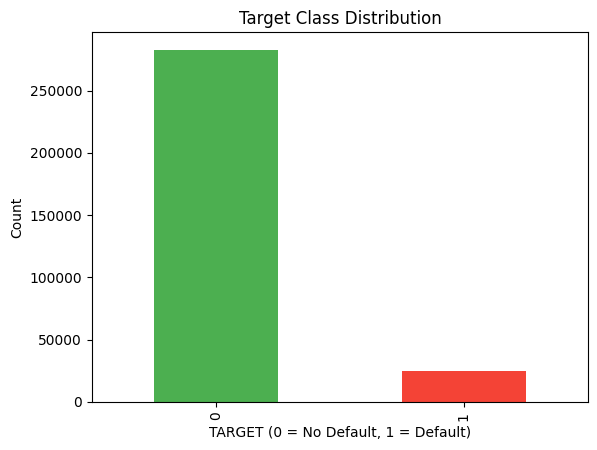

In [125]:
import matplotlib.pyplot as plt

app["TARGET"].value_counts().plot(kind="bar", color=["#4CAF50", "#F44336"])
plt.title("Target Class Distribution")
plt.xlabel("TARGET (0 = No Default, 1 = Default)")
plt.ylabel("Count")
plt.show()

# Scaling

In [126]:
X = app.drop(columns=["TARGET"])
y = app["TARGET"]

In [127]:
# for tree based models
X_tree = X.copy()

In [128]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

In [129]:
from sklearn.model_selection import train_test_split

# for tree based models
X_train_tree, X_test_tree, y_train, y_test = train_test_split(
    X_tree, y, test_size=0.2, random_state=42, stratify=y
)

# for other than tree based models
X_train_scaled, X_test_scaled, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42, stratify=y
)

In [130]:
def clean_column_names(df):
    df = df.copy()
    df.columns = (
        df.columns
        .str.replace(r"[^A-Za-z0-9_]", "_", regex=True)
    )
    return df

# Clean both datasets
# for tree based models
X_train_tree = clean_column_names(X_train_tree)
X_test_tree = clean_column_names(X_test_tree)

# for other modles
X_train_scaled = clean_column_names(X_train_scaled)
X_test_scaled = clean_column_names(X_test_scaled)

# Feature Engineering & Selection

In [131]:
# Calculate scale_pos_weight
neg = (y_train == 0).sum()
pos = (y_train == 1).sum()

scale_pos_weight = neg / pos
print("scale_pos_weight:", scale_pos_weight)

scale_pos_weight: 11.38710976837865


In [132]:
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
import lightgbm as lgb
import xgboost as xgb

scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()

rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=12,
    class_weight="balanced",
    n_jobs=-1,
    random_state=42
)

xgb_model = xgb.XGBClassifier(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=scale_pos_weight,
    eval_metric="auc",
    tree_method="hist",
    random_state=42
)

lgb_model = lgb.LGBMClassifier(
    n_estimators=300,
    learning_rate=0.1,
    class_weight="balanced",
    random_state=42
)

rf.fit(X_train_tree, y_train)
xgb_model.fit(X_train_tree, y_train)
lgb_model.fit(X_train_tree, y_train)

[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.665236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15420
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 195
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


LGBMClassifier(class_weight='balanced', n_estimators=300, random_state=42)

In [133]:
# Convert directly to DataFrame
rf_imp = pd.DataFrame({
    "Feature": X_train_tree.columns,
    "RF_Importance": rf.feature_importances_
})

# Convert directly to DataFrame
booster = xgb_model.get_booster()
gain_dict = booster.get_score(importance_type="gain")

xgb_imp = pd.DataFrame({
    "Feature": list(gain_dict.keys()),
    "XGB_Importance": list(gain_dict.values())
})

# Convert directly to DataFrame
lgb_imp = pd.DataFrame({
    "Feature": X_train_tree.columns,
    "LGB_Importance": lgb_model.feature_importances_
})

In [134]:
importance_df = (
    rf_imp.merge(xgb_imp, on="Feature", how="outer")
          .merge(lgb_imp, on="Feature", how="outer")
)

importance_df.fillna(0, inplace=True)

# Normalize importance
for col in ["RF_Importance", "XGB_Importance", "LGB_Importance"]:
    importance_df[col] = importance_df[col] / importance_df[col].sum()

# Final combined importance
importance_df["Final_Importance"] = (
    importance_df["RF_Importance"] +
    importance_df["XGB_Importance"] +
    importance_df["LGB_Importance"]
) / 3

importance_df = importance_df.sort_values(
    by="Final_Importance", ascending=False
).reset_index(drop=True)

importance_df.head(20)

,Feature,RF_Importance,XGB_Importance,LGB_Importance,Final_Importance
0,EXT_SOURCE_2,0.090385,0.027771,0.035778,0.051311
1,EXT_SOURCE_3,0.082979,0.030027,0.032889,0.048632
2,DAYS_BIRTH,0.024059,0.007763,0.030556,0.020792
3,ORGANIZATION_TYPE,0.020944,0.008774,0.023667,0.017795
4,AMT_CREDIT,0.012773,0.007182,0.028444,0.016133
5,DAYS_EMPLOYED,0.019545,0.007563,0.019778,0.015629
6,AMT_ANNUITY,0.011893,0.006810,0.027333,0.015345
7,BUREAU_DAYS_CREDIT_mean,0.023425,0.006749,0.013333,0.014502
8,BUREAU_DAYS_CREDIT_max,0.017150,0.006323,0.017333,0.013602
9,NAME_EDUCATION_TYPE,0.012402,0.021700,0.006222,0.013441


In [135]:
len(importance_df)

268

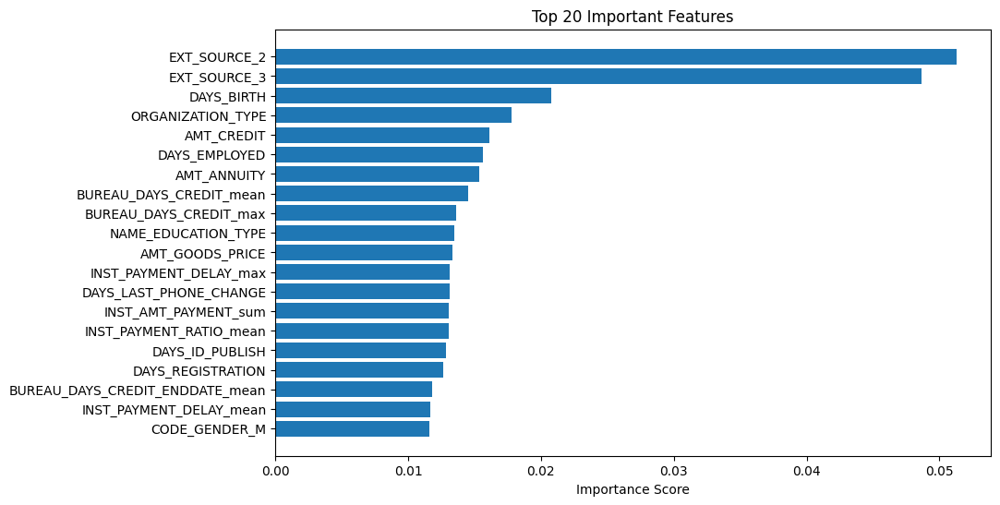

In [136]:
import os
import matplotlib.pyplot as plt

os.makedirs("outputs", exist_ok=True)

plt.figure(figsize=(10,6))

plt.barh(
    importance_df.head(20)["Feature"],
    importance_df.head(20)["Final_Importance"]
)

plt.gca().invert_yaxis()

plt.title("Top 20 Important Features")
plt.xlabel("Importance Score")

plt.savefig(
    "outputs/top_20_important_features.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

In [137]:
len(importance_df)

268

In [138]:
type(xgb)

module

In [139]:
from sklearn.metrics import roc_auc_score

feature_counts = [20, 30, 40, 50, 70, 100,120,150,200,265]
results = []

for n in feature_counts:
    feats = importance_df["Feature"].head(n)
    
    valid_feats = [f for f in feats if f in app.columns]
    X_tmp = app[valid_feats]
    y = app["TARGET"]
    
    X_train, X_test, y_train, y_test = train_test_split(
        X_tmp, y, stratify=y, random_state=42
    )
    
    model = XGBClassifier(
        scale_pos_weight=(y_train==0).sum()/(y_train==1).sum(),
        eval_metric="auc",
        tree_method="hist",
        random_state=42
    )
    
    model.fit(X_train, y_train)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:,1])
    
    results.append((n, auc))

pd.DataFrame(results, columns=["Num_Features", "ROC_AUC"])

,Num_Features,ROC_AUC
0,20,0.741613
1,30,0.750413
2,40,0.752712
3,50,0.753242
4,70,0.756436
5,100,0.758176
6,120,0.759204
7,150,0.759709
8,200,0.760219
9,265,0.760219


In [140]:
missing = [f for f in feats if f not in app.columns]
print("Missing features:", missing[:10])

Missing features: ['NAME_CONTRACT_TYPE_Revolving_loans', 'NAME_HOUSING_TYPE_House___apartment', 'NAME_FAMILY_STATUS_Single___not_married', 'WALLSMATERIAL_MODE_Stone__brick', 'NAME_INCOME_TYPE_Commercial_associate', 'NAME_TYPE_SUITE_Spouse__partner', 'NAME_HOUSING_TYPE_Office_apartment', 'HOUSETYPE_MODE_terraced_house', 'NAME_HOUSING_TYPE_Municipal_apartment', 'NAME_INCOME_TYPE_State_servant']


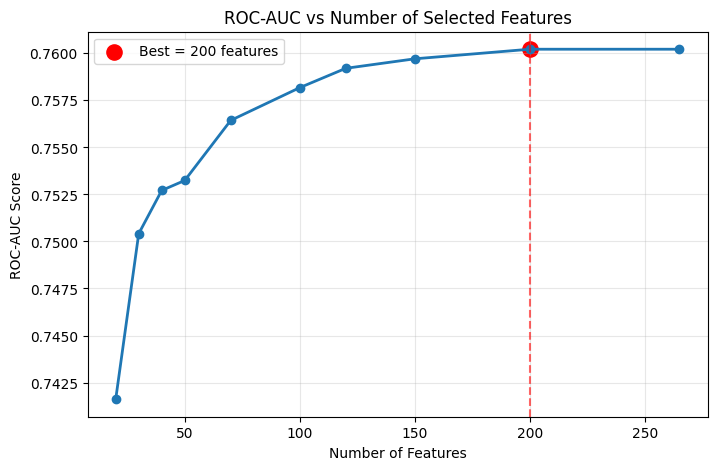

In [141]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert results to DataFrame (if not already)
results_df = pd.DataFrame(results, columns=["Num_Features", "ROC_AUC"])

# Find best feature count
best_row = results_df.loc[results_df["ROC_AUC"].idxmax()]
best_n = best_row["Num_Features"]
best_auc = best_row["ROC_AUC"]

plt.figure(figsize=(8, 5))

plt.plot(
    results_df["Num_Features"],
    results_df["ROC_AUC"],
    marker="o",
    linewidth=2
)

# Highlight best point
plt.scatter(best_n, best_auc, color="red", s=120, label=f"Best = {int(best_n)} features")
plt.axvline(best_n, color="red", linestyle="--", alpha=0.6)

plt.xlabel("Number of Features")
plt.ylabel("ROC-AUC Score")
plt.title("ROC-AUC vs Number of Selected Features")
plt.legend()
plt.grid(alpha=0.3)

plt.show()

In [142]:
final_features = importance_df["Feature"].head(200)
final_features = [f for f in final_features if f in app.columns]

In [143]:
X_final = app[final_features]
y_final = app["TARGET"]

In [144]:
# for tree based models
X_tree_final = X_final.copy()

In [145]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled_final = scaler.fit_transform(X_final)

X_scaled_final = pd.DataFrame(X_scaled_final, columns=X_final.columns)

In [146]:
from sklearn.model_selection import train_test_split

# for tree based models
X_train_tree, X_test_tree, y_train, y_test = train_test_split(
    X_tree_final, y_final, test_size=0.2, random_state=42, stratify=y
)

# for other than tree based models
X_train_scaled, X_test_scaled, y_train, y_test = train_test_split(
    X_scaled_final, y_final, test_size=0.2, random_state=42, stratify=y
)

In [147]:
# !pip install xgboost lightgbm

# Model Training

#### Without CV and hyperparameter tunning

In [148]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import xgboost as xgb
import lightgbm as lgb

# Calculate class weight ratio for boosting models
scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()

models = {
    "Logistic Regression": LogisticRegression(
        max_iter=1000, 
        class_weight="balanced",
        n_jobs=-1
    ),
    
    "Random Forest": RandomForestClassifier(
        n_estimators=200,
        max_depth=12,
        class_weight="balanced",
        n_jobs=-1,
        random_state=42
    ),
    
    "XGBoost": xgb.XGBClassifier(
        n_estimators=200,
        max_depth=6,
        learning_rate=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        scale_pos_weight=scale_pos_weight,
        eval_metric="logloss",
        tree_method="hist",
        n_jobs=-1,
        random_state=42
    ),
    
    "LightGBM": lgb.LGBMClassifier(
        n_estimators=200,
        learning_rate=0.1,
        class_weight="balanced",
        n_jobs=-1,
        random_state=42
    )
}

results = []

for name, model in models.items():
    print(f"\nTraining: {name}")
    
    # Choose correct dataset
    if name in ["Random Forest", "XGBoost", "LightGBM"]:
        model.fit(X_train_tree, y_train)
        y_pred = model.predict(X_test_tree)
        y_prob = model.predict_proba(X_test_tree)[:, 1]
    else:
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
        y_prob = model.predict_proba(X_test_scaled)[:, 1]
    
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    results.append([name, acc, auc, prec, rec, f1])
    
    print(f"Accuracy: {acc:.4f} | AUC: {auc:.4f} | Recall: {rec:.4f}")


Training: Logistic Regression
Accuracy: 0.7004 | AUC: 0.7641 | Recall: 0.6880

Training: Random Forest
Accuracy: 0.8173 | AUC: 0.7462 | Recall: 0.4618

Training: XGBoost
Accuracy: 0.7562 | AUC: 0.7749 | Recall: 0.6395

Training: LightGBM
[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.300239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15392
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 181
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Accuracy: 0.7398 | AUC: 0.7762 | Recall: 0.6679


In [149]:
# Comparison Table
results_df = pd.DataFrame(
    results, 
    columns=["Model", "Accuracy", "ROC_AUC", "Precision", "Recall", "F1"]
).sort_values(by="ROC_AUC", ascending=False)

results_df

,Model,Accuracy,ROC_AUC,Precision,Recall,F1
3,LightGBM,0.739769,0.776188,0.187641,0.667875,0.292972
2,XGBoost,0.756191,0.774893,0.193834,0.639476,0.297494
0,Logistic Regression,0.700372,0.764099,0.168317,0.688016,0.270467
1,Random Forest,0.817277,0.746227,0.211161,0.461833,0.289813


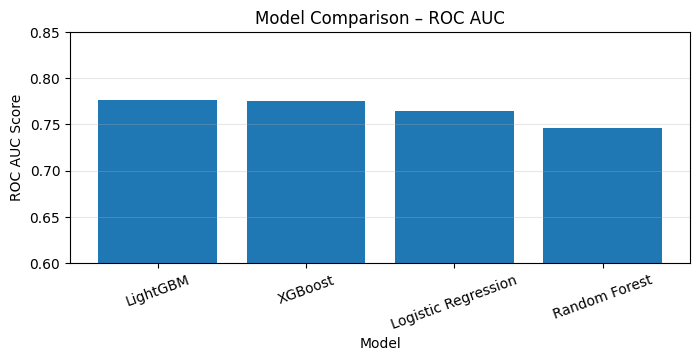

In [173]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 3))
plt.bar(results_df["Model"], results_df["ROC_AUC"])
plt.title("Model Comparison – ROC AUC")
plt.ylabel("ROC AUC Score")
plt.xlabel("Model")
plt.ylim(0.6, 0.85)
plt.xticks(rotation=20)
plt.grid(axis="y", alpha=0.3)
plt.show()

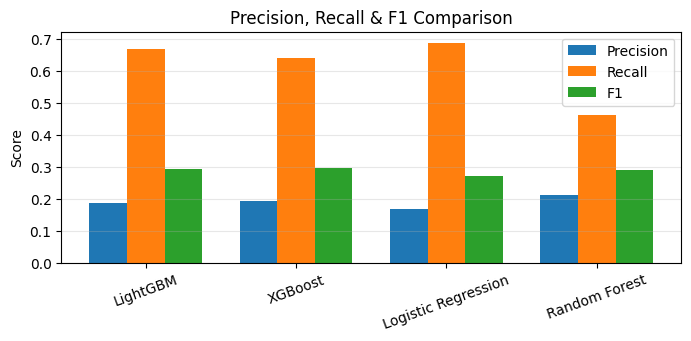

In [176]:
import numpy as np

metrics = ["Precision", "Recall", "F1"]
x = np.arange(len(results_df["Model"]))
width = 0.25

plt.figure(figsize=(8, 3))

for i, metric in enumerate(metrics):
    plt.bar(
        x + i * width,
        results_df[metric],
        width,
        label=metric
    )

plt.xticks(x + width, results_df["Model"], rotation=20)
plt.ylabel("Score")
plt.title("Precision, Recall & F1 Comparison")
plt.legend()
plt.grid(axis="y", alpha=0.3)
plt.show()

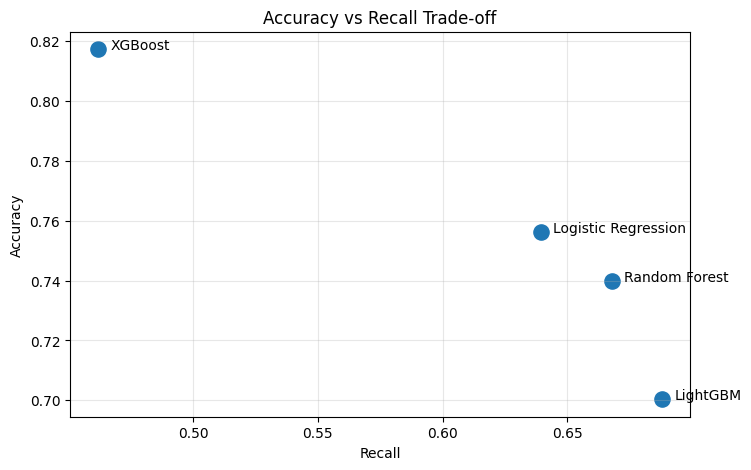

In [177]:
plt.figure(figsize=(8, 5))

plt.scatter(
    results_df["Recall"],
    results_df["Accuracy"],
    s=120
)

for i, model in enumerate(results_df["Model"]):
    plt.text(
        results_df["Recall"][i] + 0.005,
        results_df["Accuracy"][i],
        model
    )

plt.xlabel("Recall")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Recall Trade-off")
plt.grid(alpha=0.3)
plt.show()

#### model training using different parameters

In [178]:
import numpy as np
import pandas as pd

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score

import xgboost as xgb
import lightgbm as lgb

# Class imbalance ratio
scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()

# MODELS WITH UPDATED PARAMETERS
models = {
    "Logistic Regression ": LogisticRegression(
        max_iter=1500,
        C=0.5,
        class_weight="balanced",
        n_jobs=-1
    ),

    "Random Forest": RandomForestClassifier(
        n_estimators=300,
        max_depth=16,
        min_samples_leaf=20,
        class_weight="balanced",
        n_jobs=-1,
        random_state=42
    ),

    "XGBoost": xgb.XGBClassifier(
        n_estimators=400,
        max_depth=5,
        learning_rate=0.05,
        subsample=0.85,
        colsample_bytree=0.85,
        scale_pos_weight=scale_pos_weight,
        eval_metric="auc",
        tree_method="hist",
        n_jobs=-1,
        random_state=42
    ),

    "LightGBM": lgb.LGBMClassifier(
        n_estimators=400,
        learning_rate=0.05,
        num_leaves=40,
        min_child_samples=50,
        class_weight="balanced",
        n_jobs=-1,
        random_state=42
    )
}

# TRAIN & EVALUATE
results = []

for name, model in models.items():
    print(f"\nTraining: {name}")

    # Select dataset
    if "Logistic" in name:
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
        y_prob = model.predict_proba(X_test_scaled)[:, 1]
    else:
        model.fit(X_train_tree, y_train)
        y_pred = model.predict(X_test_tree)
        y_prob = model.predict_proba(X_test_tree)[:, 1]

    results.append([
        name,
        accuracy_score(y_test, y_pred),
        roc_auc_score(y_test, y_prob),
        precision_score(y_test, y_pred),
        recall_score(y_test, y_pred),
        f1_score(y_test, y_pred)
    ])


Training: Logistic Regression 

Training: Random Forest

Training: XGBoost

Training: LightGBM
[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.211647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15388
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 179
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


In [179]:
# RESULT TABLE
results_df_tuned = pd.DataFrame(
    results,
    columns=["Model", "Accuracy", "ROC_AUC", "Precision", "Recall", "F1"]
).sort_values(by="ROC_AUC", ascending=False)

results_df_tuned

,Model,Accuracy,ROC_AUC,Precision,Recall,F1
2,XGBoost,0.737021,0.778212,0.186637,0.672306,0.292166
3,LightGBM,0.747476,0.776644,0.190980,0.657603,0.295997
0,Logistic Regression,0.700372,0.764067,0.168317,0.688016,0.270467
1,Random Forest,0.862950,0.757363,0.255781,0.365358,0.300904


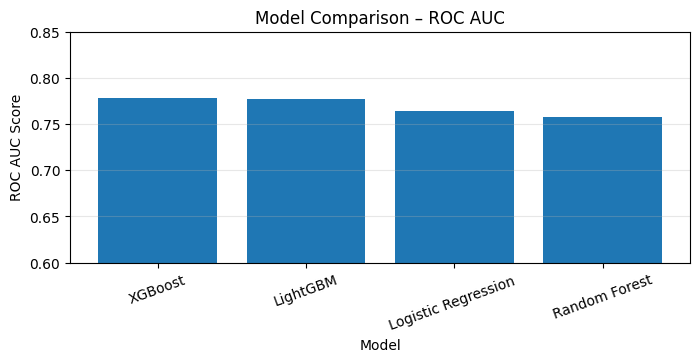

In [180]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 3))
plt.bar(results_df_tuned["Model"], results_df_tuned["ROC_AUC"])
plt.title("Model Comparison – ROC AUC")
plt.ylabel("ROC AUC Score")
plt.xlabel("Model")
plt.ylim(0.6, 0.85)
plt.xticks(rotation=20)
plt.grid(axis="y", alpha=0.3)
plt.show()

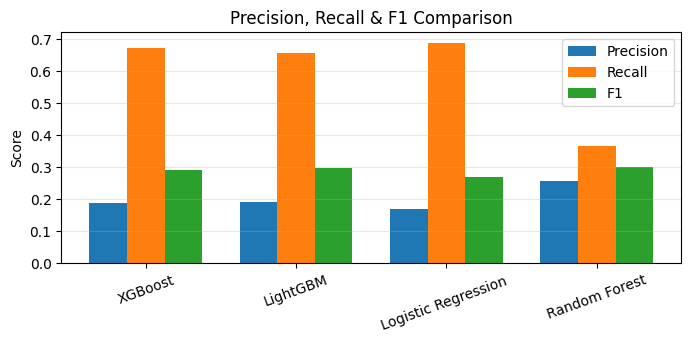

In [181]:
import numpy as np

metrics = ["Precision", "Recall", "F1"]
x = np.arange(len(results_df_tuned["Model"]))
width = 0.25

plt.figure(figsize=(8, 3))

for i, metric in enumerate(metrics):
    plt.bar(
        x + i * width,
        results_df_tuned[metric],
        width,
        label=metric
    )

plt.xticks(x + width, results_df_tuned["Model"], rotation=20)
plt.ylabel("Score")
plt.title("Precision, Recall & F1 Comparison")
plt.legend()
plt.grid(axis="y", alpha=0.3)
plt.show()

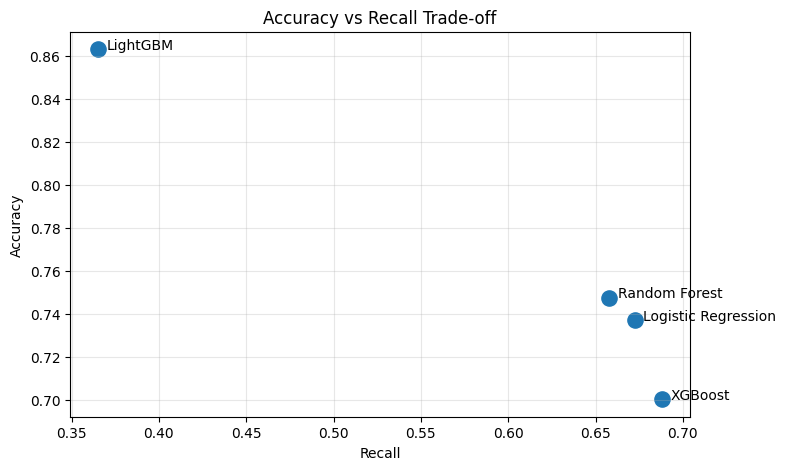

In [182]:
plt.figure(figsize=(8, 5))

plt.scatter(
    results_df_tuned["Recall"],
    results_df_tuned["Accuracy"],
    s=120
)

for i, model in enumerate(results_df_tuned["Model"]):
    plt.text(
        results_df_tuned["Recall"][i] + 0.005,
        results_df_tuned["Accuracy"][i],
        model
    )

plt.xlabel("Recall")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Recall Trade-off")
plt.grid(alpha=0.3)
plt.show()

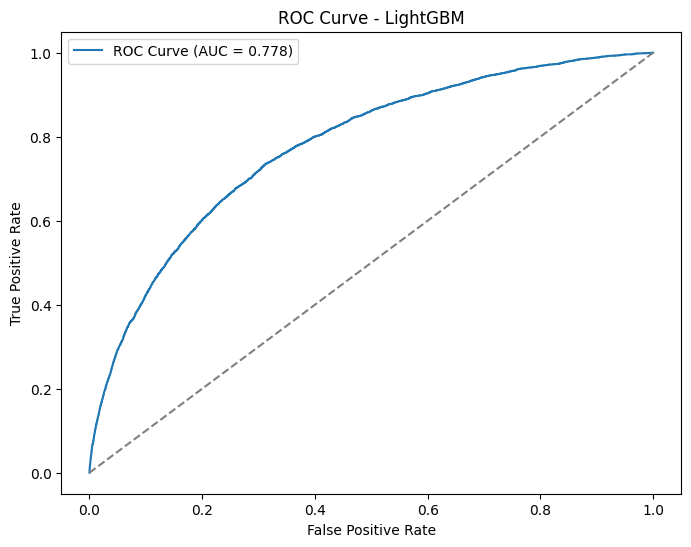

In [183]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Example: Using LightGBM predictions
y_prob = models["XGBoost"].predict_proba(X_test_tree)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - LightGBM")
plt.legend()
plt.show()

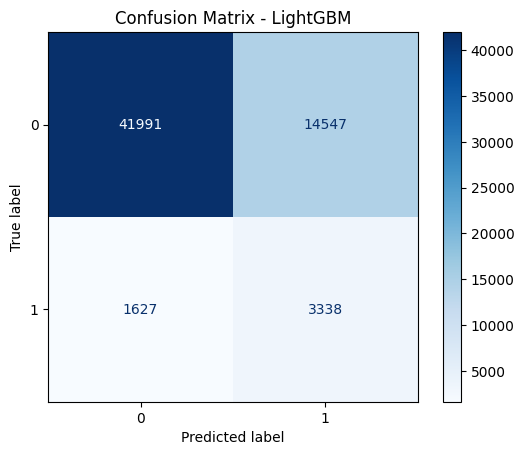

In [184]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict class labels
y_pred = models["XGBoost"].predict(X_test_tree)

cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")

plt.title("Confusion Matrix - LightGBM")
plt.show()

#### with CV and Hyperparameter Tunning

In [185]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb


# 3. CV STRATEGY
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# 4. MODELS + SAFE PARAMS
models = {
    "Logistic": {
        "model": LogisticRegression(class_weight="balanced", max_iter=1000),
        "X_train": X_train_scaled,
        "X_test": X_test_scaled,
        "params": {
            "C": [0.01, 0.1, 1]
        }
    },

    "RandomForest": {
        "model": RandomForestClassifier(
            n_estimators=200,
            class_weight="balanced",
            random_state=42,
            n_jobs=-1
        ),
        "X_train": X_train_tree,
        "X_test": X_test_tree,
        "params": {
            "max_depth": [5, 10],
            "min_samples_split": [2, 10]
        }
    },

    "XGBoost": {
        "model": xgb.XGBClassifier(
            n_estimators=300,
            learning_rate=0.1,
            eval_metric="auc",
            tree_method="hist",
            scale_pos_weight=(y_train.value_counts()[0] / y_train.value_counts()[1]),
            random_state=42
        ),
        "X_train": X_train_tree,
        "X_test": X_test_tree,
        "params": {
            "max_depth": [4, 6],
            "subsample": [0.8, 1.0]
        }
    },

    "LightGBM": {
        "model": lgb.LGBMClassifier(
            n_estimators=300,
            learning_rate=0.1,
            class_weight="balanced",
            random_state=42
        ),
        "X_train": X_train_tree,
        "X_test": X_test_tree,
        "params": {
            "num_leaves": [31, 50],
            "max_depth": [-1, 10]
        }
    }
}

# 5. TRAIN + TUNE (MEMORY SAFE)
results = []
best_models = {}

for name, config in models.items():
    print(f"\nTraining {name}...")

    search = RandomizedSearchCV(
        estimator=config["model"],
        param_distributions=config["params"],
        scoring="roc_auc",
        cv=cv,
        n_iter=5,            # memory-safe
        n_jobs=1,           # avoid RAM crash
        random_state=42
    )

    search.fit(config["X_train"], y_train)

    best_models[name] = search.best_estimator_

    y_prob = search.best_estimator_.predict_proba(config["X_test"])[:, 1]
    auc = roc_auc_score(y_test, y_prob)

    results.append([name, auc])


Training Logistic...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 3 is smaller than n_iter=5. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(



Training RandomForest...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(



Training XGBoost...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(



Training LightGBM...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


[LightGBM] [Info] Number of positive: 13240, number of negative: 150765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.192232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15390
[LightGBM] [Info] Number of data points in the train set: 164005, number of used features: 180
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Number of positive: 13240, number of negative: 150765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.168794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15394
[LightGBM] [Info] Number of data points in the train set: 164005, number of used features: 180
[LightGBM] [

In [186]:
# 6. MODEL COMPARISON
results_df = pd.DataFrame(results, columns=["Model", "ROC_AUC"])
results_df = results_df.sort_values(by="ROC_AUC", ascending=False)

print("\nModel Comparison:")
print(results_df)

# 7. BEST MODEL REPORT
best_model_name = results_df.iloc[0]["Model"]
best_model = best_models[best_model_name]

X_test_final = models[best_model_name]["X_test"]
y_pred = best_model.predict(X_test_final)
print(f"\nBest Model: {best_model_name}")


Model Comparison:
          Model   ROC_AUC
2       XGBoost  0.777639
3      LightGBM  0.775810
0      Logistic  0.764052
1  RandomForest  0.748257

Best Model: XGBoost


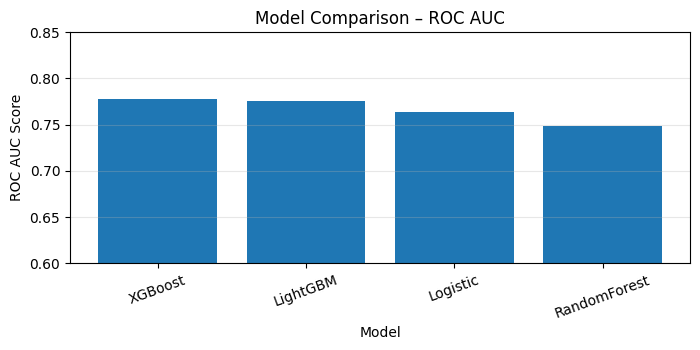

In [187]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 3))
plt.bar(results_df["Model"], results_df["ROC_AUC"])
plt.title("Model Comparison – ROC AUC")
plt.ylabel("ROC AUC Score")
plt.xlabel("Model")
plt.ylim(0.6, 0.85)
plt.xticks(rotation=20)
plt.grid(axis="y", alpha=0.3)
plt.show()

In [188]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.73      0.83     56538
           1       0.18      0.68      0.29      4965

    accuracy                           0.73     61503
   macro avg       0.57      0.71      0.56     61503
weighted avg       0.90      0.73      0.79     61503



In [189]:
from sklearn.metrics import precision_recall_curve

y_prob = best_model.predict_proba(X_test_tree)[:, 1]

precision, recall, thresholds = precision_recall_curve(y_test, y_prob)
f1 = 2 * (precision * recall) / (precision + recall)

best_idx = f1.argmax()
best_threshold = thresholds[best_idx]

print("Best Threshold:", best_threshold)
print("Precision:", precision[best_idx])
print("Recall:", recall[best_idx])
print("F1:", f1[best_idx])

Best Threshold: 0.6701199
Precision: 0.27006837173968096
Recall: 0.429607250755287
F1: 0.33164891549405273


In [190]:
y_pred_optimized = (y_prob >= best_threshold).astype(int)

print("Classification Report (Optimized Threshold):\n")
print(classification_report(y_test, y_pred_optimized))

Classification Report (Optimized Threshold):

              precision    recall  f1-score   support

           0       0.95      0.90      0.92     56538
           1       0.27      0.43      0.33      4965

    accuracy                           0.86     61503
   macro avg       0.61      0.66      0.63     61503
weighted avg       0.89      0.86      0.87     61503



#### model training using diiferent cv and hyperparameters

In [191]:
import numpy as np
import pandas as pd

from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb

# 1. CV STRATEGY 
cv = StratifiedShuffleSplit(
    n_splits=3,     # memory-safe
    test_size=0.3,
    random_state=42
)

# 2. MODELS + SAFE PARAMETER GRIDS
models = {
    "Logistic": {
        "model": LogisticRegression(
            class_weight="balanced",
            max_iter=1000,
            solver="liblinear"   # memory efficient
        ),
        "X_train": X_train_scaled,
        "X_test": X_test_scaled,
        "params": {
            "C": [0.05, 0.1, 0.5]
        }
    },

    "RandomForest": {
        "model": RandomForestClassifier(
            n_estimators=150,
            class_weight="balanced",
            random_state=42,
            n_jobs=1
        ),
        "X_train": X_train_tree,
        "X_test": X_test_tree,
        "params": {
            "max_depth": [6, 10],
            "min_samples_leaf": [20, 50]
        }
    },

    "XGBoost": {
        "model": xgb.XGBClassifier(
            n_estimators=250,
            learning_rate=0.05,
            eval_metric="auc",
            tree_method="hist",
            scale_pos_weight=(y_train.value_counts()[0] / y_train.value_counts()[1]),
            random_state=42
        ),
        "X_train": X_train_tree,
        "X_test": X_test_tree,
        "params": {
            "max_depth": [4, 6],
            "subsample": [0.7, 0.9]
        }
    },

    "LightGBM": {
        "model": lgb.LGBMClassifier(
            n_estimators=250,
            learning_rate=0.05,
            class_weight="balanced",
            random_state=42
        ),
        "X_train": X_train_tree,
        "X_test": X_test_tree,
        "params": {
            "num_leaves": [31, 40],
            "max_depth": [8, -1]
        }
    }
}

# 3. RandomizedSearchCV 
results = []
best_models = {}

for name, config in models.items():
    print(f"\nTraining {name}...")

    search = RandomizedSearchCV(
        estimator=config["model"],
        param_distributions=config["params"],
        scoring="roc_auc",
        cv=cv,
        n_iter=5,            # memory-safe
        n_jobs=1,           # avoid RAM crash
        random_state=42
    )

    search.fit(config["X_train"], y_train)

    best_models[name] = search.best_estimator_

    y_prob = search.best_estimator_.predict_proba(config["X_test"])[:, 1]
    auc = roc_auc_score(y_test, y_prob)

    results.append([name, auc])


Training Logistic...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 3 is smaller than n_iter=5. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(



Training RandomForest...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(



Training XGBoost...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(



Training LightGBM...


C:\Users\Rushikesh Maske\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


[LightGBM] [Info] Number of positive: 13902, number of negative: 158303
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.267674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15394
[LightGBM] [Info] Number of data points in the train set: 172205, number of used features: 180
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 13902, number of negative: 158303
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.184119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 15392
[LightGBM] [Info] Number of data points in the train set: 172205, number of used features: 180
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[Lig

In [192]:
# 4. MODEL COMPARISON
results_df = (
    pd.DataFrame(results, columns=["Model", "ROC_AUC"])
    .sort_values(by="ROC_AUC", ascending=False)
)

print("\nModel Comparison:")
print(results_df)

best_model_name = results_df.iloc[0]["Model"]
best_model = best_models[best_model_name]
X_test_final = models[best_model_name]["X_test"]

print(f"\nBest Model: {best_model_name}")


Model Comparison:
          Model   ROC_AUC
3      LightGBM  0.776851
2       XGBoost  0.775580
0      Logistic  0.764020
1  RandomForest  0.750736

Best Model: LightGBM


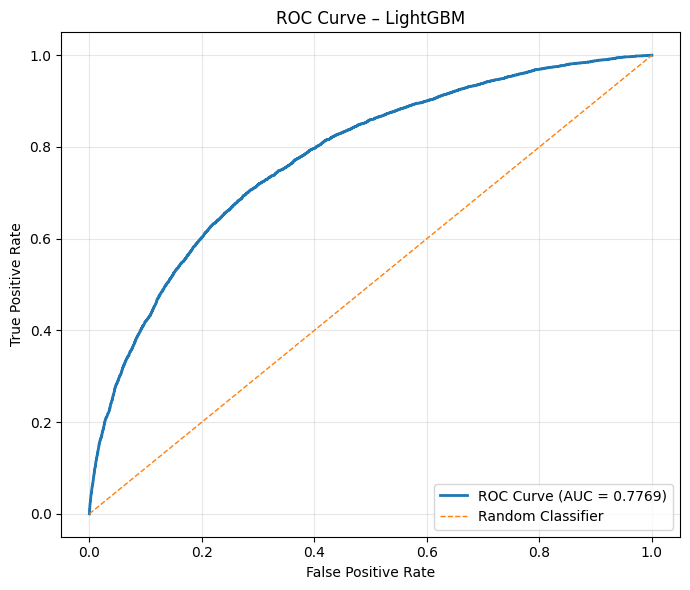

In [193]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# -------------------------
# ROC CURVE
# -------------------------
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, linewidth=2, label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], linestyle='--', linewidth=1, label="Random Classifier")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(f"ROC Curve – {best_model_name}")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [194]:
# 5. DEFAULT THRESHOLD REPORT
y_pred_default = best_model.predict(X_test_final)
print("\nClassification Report (Default Threshold):\n")
print(classification_report(y_test, y_pred_default))


Classification Report (Default Threshold):

              precision    recall  f1-score   support

           0       0.96      0.73      0.83     56538
           1       0.18      0.69      0.29      4965

    accuracy                           0.73     61503
   macro avg       0.57      0.71      0.56     61503
weighted avg       0.90      0.73      0.79     61503



In [195]:
# 6. THRESHOLD OPTIMIZATION 
y_prob = best_model.predict_proba(X_test_final)[:, 1]

precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

f1 = np.zeros_like(precision)

mask = (precision + recall) > 0
f1[mask] = 2 * (precision[mask] * recall[mask]) / (precision[mask] + recall[mask])

best_idx = f1.argmax()
best_threshold = thresholds[best_idx]

print("\nOptimized Threshold Results:")
print("Best Threshold :", best_threshold)
print("Precision      :", precision[best_idx])
print("Recall         :", recall[best_idx])
print("F1-score       :", f1[best_idx])


Optimized Threshold Results:
Best Threshold : 0.6438043136136029
Precision      : 0.25227248422628595
Recall         : 0.4751258811681772
F1-score       : 0.32956132998044146


In [196]:
# 7. OPTIMIZED THRESHOLD REPORT
y_pred_opt = (y_prob >= best_threshold).astype(int)

print("\nClassification Report (Optimized Threshold):\n")
print(classification_report(y_test, y_pred_opt))


Classification Report (Optimized Threshold):

              precision    recall  f1-score   support

           0       0.95      0.88      0.91     56538
           1       0.25      0.48      0.33      4965

    accuracy                           0.84     61503
   macro avg       0.60      0.68      0.62     61503
weighted avg       0.89      0.84      0.86     61503



In [198]:
# Save model
import joblib
joblib.dump(model, "model.pkl")

print("Model saved successfully!")

Model saved successfully!
